In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings # Hide warning messages
warnings.filterwarnings("ignore")
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [2]:
df=pd.read_csv("advertising.csv")

In [3]:
df.head()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Ad Topic Line,City,Male,Country,Timestamp,Clicked on Ad
0,68.95,35,61833.90,256.09,Cloned 5thgeneration orchestration,Wrightburgh,0,Tunisia,2016-03-27 00:53:11,0
1,80.23,31,68441.85,193.77,Monitored national standardization,West Jodi,1,Nauru,2016-04-04 01:39:02,0
2,69.47,26,59785.94,236.50,Organic bottom-line service-desk,Davidton,0,San Marino,2016-03-13 20:35:42,0
3,74.15,29,54806.18,245.89,Triple-buffered reciprocal time-frame,West Terrifurt,1,Italy,2016-01-10 02:31:19,0
4,68.37,35,73889.99,225.58,Robust logistical utilization,South Manuel,0,Iceland,2016-06-03 03:36:18,0


In [4]:
df.shape

(1000, 10)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Daily Time Spent on Site  1000 non-null   float64
 1   Age                       1000 non-null   int64  
 2   Area Income               1000 non-null   float64
 3   Daily Internet Usage      1000 non-null   float64
 4   Ad Topic Line             1000 non-null   object 
 5   City                      1000 non-null   object 
 6   Male                      1000 non-null   int64  
 7   Country                   1000 non-null   object 
 8   Timestamp                 1000 non-null   object 
 9   Clicked on Ad             1000 non-null   int64  
dtypes: float64(3), int64(3), object(4)
memory usage: 78.2+ KB


In [6]:
df.describe()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,65.000200,36.009000,55000.000080,180.000100,0.481000,0.50000
std,15.853615,8.785562,13414.634022,43.902339,0.499889,0.50025
min,32.600000,19.000000,13996.500000,104.780000,0.000000,0.00000
25%,51.360000,29.000000,47031.802500,138.830000,0.000000,0.00000
50%,68.215000,35.000000,57012.300000,183.130000,0.000000,0.50000
75%,78.547500,42.000000,65470.635000,218.792500,1.000000,1.00000
max,91.430000,61.000000,79484.800000,269.960000,1.000000,1.00000


We will start understand the data

In [7]:
# Check duplicacy present in data
df['Daily Time Spent on Site'].duplicated().sum() # A parameter can have duplicate values.

100

In [8]:
# We will check duplicacy in rows
df.duplicated().sum()

0

In [9]:
# We will check missing values
for col in df.columns:
    prompt = (df[col].isnull().sum())
    print('Null Values in',col+" is = "+str(prompt))


Null Values in Daily Time Spent on Site is = 0
Null Values in Age is = 0
Null Values in Area Income is = 0
Null Values in Daily Internet Usage is = 0
Null Values in Ad Topic Line is = 0
Null Values in City is = 0
Null Values in Male is = 0
Null Values in Country is = 0
Null Values in Timestamp is = 0
Null Values in Clicked on Ad is = 0


We have no missing values in any parameter

# No we will separate numerical and categorical variables

In [10]:
df.dtypes

Daily Time Spent on Site    float64
Age                           int64
Area Income                 float64
Daily Internet Usage        float64
Ad Topic Line                object
City                         object
Male                          int64
Country                      object
Timestamp                    object
Clicked on Ad                 int64
dtype: object

In [11]:
df.select_dtypes(include='int64').columns

Index(['Age', 'Male', 'Clicked on Ad'], dtype='object')

In [12]:
df.select_dtypes(include='int64').head(5)

,Age,Male,Clicked on Ad
0,35,0,0
1,31,1,0
2,26,0,0
3,29,1,0
4,35,0,0


In [13]:
df.select_dtypes(include='object').columns

Index(['Ad Topic Line', 'City', 'Country', 'Timestamp'], dtype='object')

In [14]:
df.select_dtypes(include='object').head(5)

,Ad Topic Line,City,Country,Timestamp
0,Cloned 5thgeneration orchestration,Wrightburgh,Tunisia,2016-03-27 00:53:11
1,Monitored national standardization,West Jodi,Nauru,2016-04-04 01:39:02
2,Organic bottom-line service-desk,Davidton,San Marino,2016-03-13 20:35:42
3,Triple-buffered reciprocal time-frame,West Terrifurt,Italy,2016-01-10 02:31:19
4,Robust logistical utilization,South Manuel,Iceland,2016-06-03 03:36:18


In [15]:
df.select_dtypes(include='float64').columns

Index(['Daily Time Spent on Site', 'Area Income', 'Daily Internet Usage'], dtype='object')

In [16]:
df.select_dtypes(include='float64').head(5)

,Daily Time Spent on Site,Area Income,Daily Internet Usage
0,68.95,61833.90,256.09
1,80.23,68441.85,193.77
2,69.47,59785.94,236.50
3,74.15,54806.18,245.89
4,68.37,73889.99,225.58


Summing up the above process we can see:
- we have 3 different data types - float, int, string(object).
- we can use int and float as numerical data type only.

In [17]:
numerical_df=df[df.select_dtypes(include=('int64','float64')).columns]

In [18]:
numerical_df

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad
0,68.95,35,61833.90,256.09,0,0
1,80.23,31,68441.85,193.77,1,0
2,69.47,26,59785.94,236.50,0,0
3,74.15,29,54806.18,245.89,1,0
4,68.37,35,73889.99,225.58,0,0
...,...,...,...,...,...,...
995,72.97,30,71384.57,208.58,1,1
996,51.30,45,67782.17,134.42,1,1
997,51.63,51,42415.72,120.37,1,1
998,55.55,19,41920.79,187.95,0,0


In [19]:
categorical_df=df[df.select_dtypes(include='object').columns]
categorical_df.head(5)

,Ad Topic Line,City,Country,Timestamp
0,Cloned 5thgeneration orchestration,Wrightburgh,Tunisia,2016-03-27 00:53:11
1,Monitored national standardization,West Jodi,Nauru,2016-04-04 01:39:02
2,Organic bottom-line service-desk,Davidton,San Marino,2016-03-13 20:35:42
3,Triple-buffered reciprocal time-frame,West Terrifurt,Italy,2016-01-10 02:31:19
4,Robust logistical utilization,South Manuel,Iceland,2016-06-03 03:36:18


We just found out that pandas is considering Timestamp as object column

In [20]:
categorical_df.drop(columns='Timestamp',inplace=True)
categorical_df

,Ad Topic Line,City,Country
0,Cloned 5thgeneration orchestration,Wrightburgh,Tunisia
1,Monitored national standardization,West Jodi,Nauru
2,Organic bottom-line service-desk,Davidton,San Marino
3,Triple-buffered reciprocal time-frame,West Terrifurt,Italy
4,Robust logistical utilization,South Manuel,Iceland
...,...,...,...
995,Fundamental modular algorithm,Duffystad,Lebanon
996,Grass-roots cohesive monitoring,New Darlene,Bosnia and Herzegovina
997,Expanded intangible solution,South Jessica,Mongolia
998,Proactive bandwidth-monitored policy,West Steven,Guatemala


Now as we have removed timestamp column we can study statistical distribution of numerical and categorical columns

In [21]:
numerical_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Daily Time Spent on Site,1000.0,65.00020,15.853615,32.60,51.3600,68.215,78.5475,91.43
Age,1000.0,36.00900,8.785562,19.00,29.0000,35.000,42.0000,61.00
Area Income,1000.0,55000.00008,13414.634022,13996.50,47031.8025,57012.300,65470.6350,79484.80
Daily Internet Usage,1000.0,180.00010,43.902339,104.78,138.8300,183.130,218.7925,269.96
Male,1000.0,0.48100,0.499889,0.00,0.0000,0.000,1.0000,1.00
Clicked on Ad,1000.0,0.50000,0.500250,0.00,0.0000,0.500,1.0000,1.00


- If mean and median (50 % values of an parameter) has some sort of very minimum gap then it says data is not skewed.
- When the mean and median have a small gap between them, it suggests that there are no extreme values (outliers) pulling the mean away from the median. This scenario commonly occurs in distributions such as the normal distribution, which is symmetric and has mean equal to median.

In [22]:
categorical_df.describe().T

,count,unique,top,freq
Ad Topic Line,1000,1000,Cloned 5thgeneration orchestration,1
City,1000,969,Lisamouth,3
Country,1000,237,France,9


- City column has 969 out of 1000 values which tells that it is very hard to predict anything using this column.
- On the other hand we can see country column 237/1000 values it will help us alot in prediction

## Now we will separate out Timestamp column

In [23]:
# Creating timestamp column
df['Timestamp']=pd.to_datetime(df['Timestamp'])


In [24]:
# creating month, day and hour column
df['month']=df['Timestamp'].dt.month
df['day']=df['Timestamp'].dt.day
df['hour']=df['Timestamp'].dt.hour
df['weekday']=df['Timestamp'].dt.dayofweek
df.head()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Ad Topic Line,City,Male,Country,Timestamp,Clicked on Ad,month,day,hour,weekday
0,68.95,35,61833.90,256.09,Cloned 5thgeneration orchestration,Wrightburgh,0,Tunisia,2016-03-27 00:53:11,0,3,27,0,6
1,80.23,31,68441.85,193.77,Monitored national standardization,West Jodi,1,Nauru,2016-04-04 01:39:02,0,4,4,1,0
2,69.47,26,59785.94,236.50,Organic bottom-line service-desk,Davidton,0,San Marino,2016-03-13 20:35:42,0,3,13,20,6
3,74.15,29,54806.18,245.89,Triple-buffered reciprocal time-frame,West Terrifurt,1,Italy,2016-01-10 02:31:19,0,1,10,2,6
4,68.37,35,73889.99,225.58,Robust logistical utilization,South Manuel,0,Iceland,2016-06-03 03:36:18,0,6,3,3,4


In [25]:
df['Timestamp'].dt.year.nunique()

1

We have separated different values from time stamp and also understand that year is constant with 2016 value.

In [26]:
df['Timestamp'].dt.minute.unique()

array([53, 39, 35, 31, 36, 30, 59, 40, 33, 42, 19, 10, 14, 49, 41, 20,  0,
       43, 52, 22, 27, 25, 46, 32,  8, 38, 23, 13,  5, 12, 26, 18, 28, 11,
       16, 54,  1,  7, 57, 56, 45, 55, 17, 37, 24, 21, 34, 51, 47,  2,  4,
       50, 44, 48, 15,  9,  6, 58, 29,  3], dtype=int64)

We can see that minute column is of no use hence we can utilize weekday as an important feature.

# Visually Analysing data -: Uni-variate & Bi-variate analysis 

In [27]:
df.columns

Index(['Daily Time Spent on Site', 'Age', 'Area Income',
       'Daily Internet Usage', 'Ad Topic Line', 'City', 'Male', 'Country',
       'Timestamp', 'Clicked on Ad', 'month', 'day', 'hour', 'weekday'],
      dtype='object')

In [28]:
px.histogram(df,x='Daily Time Spent on Site', 
             color='Clicked on Ad',
             template='none',
             color_discrete_sequence= px.colors.sequential.Darkmint)

In [29]:
px.histogram(df,x='Age',
             color='Clicked on Ad',
             template='none',
             color_discrete_sequence= px.colors.sequential.Plasma_r)

In [30]:
px.histogram(df,x='Area Income',
             color='Clicked on Ad',
             template='none',
             color_discrete_sequence= px.colors.sequential.Teal)

In [31]:
px.histogram(df,x='Daily Internet Usage',
             color='Clicked on Ad',
             template='none',
             color_discrete_sequence= px.colors.sequential.Darkmint)

In [32]:
px.histogram(df,x='weekday',
             color='Clicked on Ad',
             template='none',
             color_discrete_sequence= px.colors.sequential.Teal)

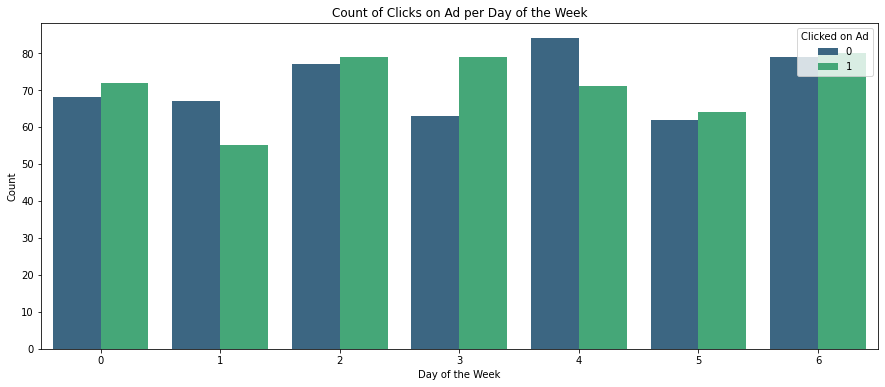

In [33]:
# 0:Monday 6:Sunday
plt.figure(figsize=(15, 6))
sns.countplot(data=df, x='weekday', hue='Clicked on Ad',palette='viridis')
plt.xlabel('Day of the Week')
plt.ylabel('Count')
plt.title('Count of Clicks on Ad per Day of the Week')
plt.legend(title='Clicked on Ad', loc='upper right')
plt.show()

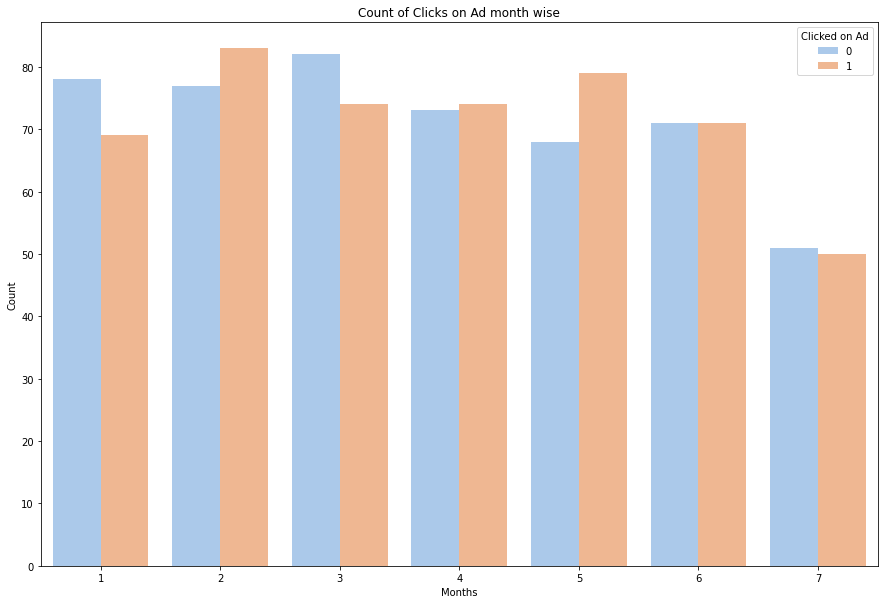

In [34]:
plt.figure(figsize=(15, 10))
sns.countplot(data=df, x='month', hue='Clicked on Ad',palette='pastel')
plt.xlabel('Months')
plt.ylabel('Count')
plt.title('Count of Clicks on Ad month wise')
plt.legend(title='Clicked on Ad', loc='upper right')
plt.show()

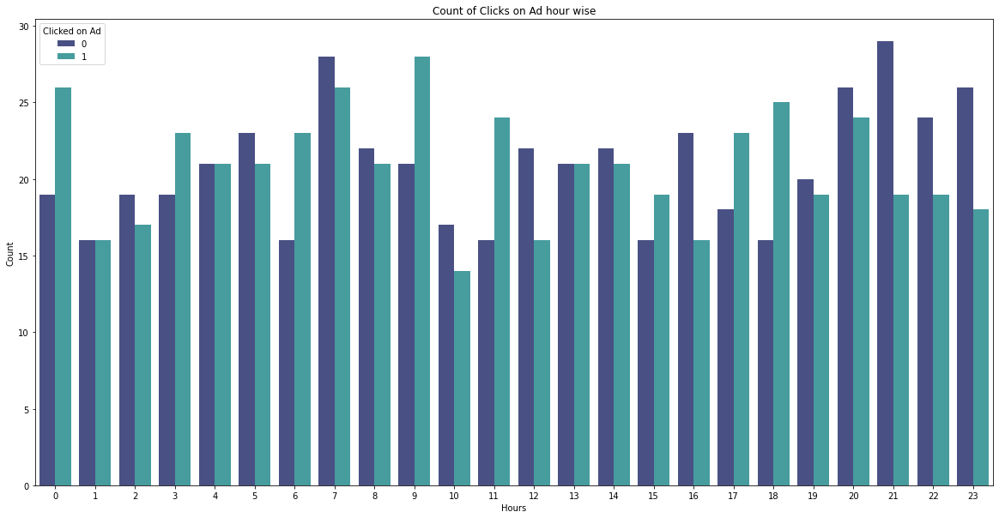

In [35]:
plt.figure(figsize=(20,10))
sns.countplot(data=df, x='hour', hue='Clicked on Ad',palette='mako')
plt.xlabel('Hours')
plt.ylabel('Count')
plt.title('Count of Clicks on Ad hour wise')
plt.legend(title='Clicked on Ad', loc='upper left')
plt.show()

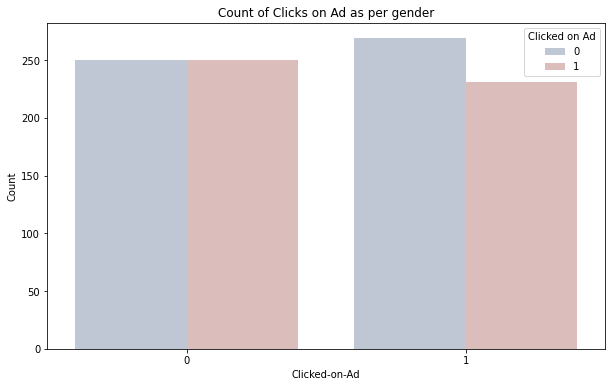

In [36]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, x='Clicked on Ad', hue='Male',palette='vlag')
plt.xlabel('Clicked-on-Ad')
plt.ylabel('Count')
plt.title('Count of Clicks on Ad as per gender')
plt.legend(title='Clicked on Ad', loc='upper right')
plt.show()

# Now we will analyse categorical data

As we can see that city column has values around 969/1000 unique values, but still we will see some visual analysis w.r.t city.

In [37]:
df.select_dtypes(include='object').columns

Index(['Ad Topic Line', 'City', 'Country'], dtype='object')

In [38]:
# Top 25 cities with daily internet usage
dailyinternet_city=pd.DataFrame(df.groupby('City')['Daily Internet Usage'].sum().sort_values(ascending=False)[:25])
dailyinternet_city=dailyinternet_city.rename_axis(['city']).reset_index()
dailyinternet_city

,city,Daily Internet Usage
0,Williamsport,520.02
1,Lisamouth,491.30
2,Wrightburgh,449.89
3,Benjaminchester,434.68
4,Lake Patrick,430.09
5,New Sheila,426.63
6,New Jessicaport,424.68
7,North Daniel,420.35
8,Pamelamouth,417.94
9,East Timothy,415.46


In [39]:
px.bar(dailyinternet_city,x='city',y='Daily Internet Usage', template='none',color_discrete_sequence= px.colors.sequential.Redor)

City vs Time stamp on site

In [40]:
dailytime=pd.DataFrame(df.groupby('City')['Daily Time Spent on Site'].sum().sort_values(ascending=False)[:25])
dailytime=dailytime.rename_axis(['City']).reset_index()
dailytime

,City,Daily Time Spent on Site
0,Williamsport,176.45
1,New Jessicaport,168.00
2,Pamelamouth,164.94
3,Lisamouth,161.06
4,Johnstad,158.39
5,North Daniel,156.45
6,Lake Patrick,155.55
7,East Timothy,153.81
8,Lake Jose,152.67
9,Shelbyport,150.48


In [41]:
fig=px.bar(dailytime,x='City',y='Daily Time Spent on Site',template='none',barmode='relative',color_discrete_sequence= px.colors.sequential.Plasma_r)
fig.update_layout(
title='City with time spent on site')
fig.show()

In [42]:
dailytime_gender=pd.DataFrame(df.groupby(['City','Male'])['Daily Time Spent on Site'].sum().sort_values(ascending=False)[:25])
dailytime_gender=dailytime_gender.rename_axis(['City','Male']).reset_index()
dailytime_gender

,City,Male,Daily Time Spent on Site
0,Johnstad,0,158.39
1,North Daniel,1,156.45
2,Lake Patrick,1,155.55
3,Millertown,1,150.00
4,New Sheila,1,149.45
5,Port Julie,1,137.14
6,Port Juan,0,123.52
7,Port Jason,1,119.87
8,Lake Susan,1,119.79
9,Joneston,1,118.64


In [43]:
color_map={1:'blue',0:'pink'}

fig=px.bar(dailytime_gender,x='City',y='Daily Time Spent on Site',color='Male',template='none',barmode='relative',color_continuous_scale=[[0, 'pink'], [1, 'blue']],facet_col='Male')
fig.update_layout(
title='Gender in City with time spent on site')
fig.show()

<AxesSubplot:xlabel='City', ylabel='Daily Time Spent on Site'>

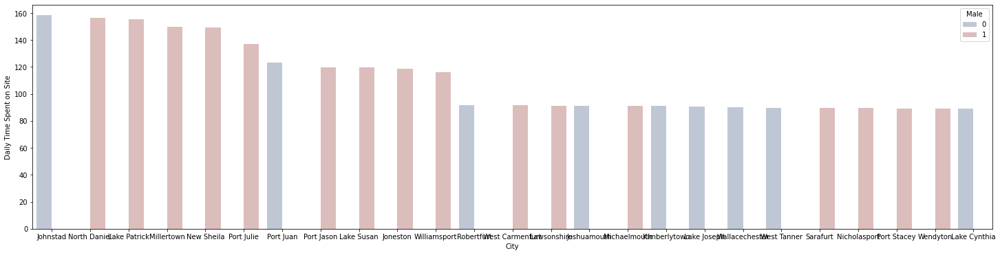

In [44]:
plt.figure(figsize=(25, 6))
sns.barplot(data=dailytime_gender,x='City',y='Daily Time Spent on Site',hue='Male',palette='vlag')

Above graph looks weird- As we can see in our data city= 969/1000 therefor, values are not synced w.r.t city column 

We can check just for analysis purpose 
- About the income of people city-wise and classified it with gender

In [45]:
incomecity=pd.DataFrame(df.groupby(['City','Male'])['Area Income'].sum().sort_values(ascending=False)[:25])
incomecity=incomecity.rename_axis(['City','Male']).reset_index()
incomecity

,City,Male,Area Income
0,Port Juan,0,145590.76
1,Johnstad,0,133662.40
2,Lake Patrick,1,131375.87
3,North Daniel,1,122411.87
4,Robertfurt,0,119929.27
5,New Sheila,1,117610.99
6,Lake Susan,1,106108.36
7,Port Julie,1,102960.67
8,Lisamouth,1,101413.78
9,Williamsport,1,91803.39


In [46]:
px.bar(incomecity,x='City',y='Area Income',color='Male')

# Country parameter analysis

In [47]:
pd.crosstab(df['Country'],df['Clicked on Ad']).sort_values(1,0,ascending=False).head(10)

Clicked on Ad,0,1
Country,,
Australia,1,7
Turkey,1,7
Ethiopia,0,7
Liberia,2,6
South Africa,2,6
Liechtenstein,0,6
Senegal,3,5
Peru,3,5
Mayotte,1,5


In [48]:
pd.crosstab(df['Country'],df['Male']).sort_values(1,0,ascending=False).head(25)

Male,0,1
Country,,
Czech Republic,2,7
Saint Vincent and the Grenadines,0,6
Micronesia,2,6
Korea,0,5
Turkey,3,5
El Salvador,1,5
Anguilla,1,5
Philippines,1,5
Ethiopia,2,5


In [49]:
# maximum number of internet user belongs to which country
pd.crosstab(df['Country'], columns='count').sort_values(['count'], ascending=False).head(20)


col_0,count
Country,
France,9
Czech Republic,9
Afghanistan,8
Australia,8
Turkey,8
South Africa,8
Senegal,8
Peru,8
Micronesia,8


Hourly distribution of ads click 

In [50]:
pivot_data = df.pivot_table(index='hour',columns='Male',values='Clicked on Ad', aggfunc='sum')
pivot_data.columns = ['Female', 'Male']
cm = "BrBG_r"
pivot_data.style.background_gradient(cmap=cm)


,Female,Male
hour,,
0,16,10
1,9,7
2,10,7
3,9,14
4,8,13
5,13,8
6,10,13
7,15,11
8,13,8


We can check hourly distribution of ad click w.r.t coutry column

In [51]:
pd.set_option('display.max_rows', None)
def countrydata():
    country_pivot=df.pivot_table(index='Country',columns='Male',values='Clicked on Ad',aggfunc='sum')
    print(country_pivot)
    
countrydata()    

Male                                                  0    1
Country                                                     
Afghanistan                                         4.0  1.0
Albania                                             2.0  2.0
Algeria                                             3.0  0.0
American Samoa                                      2.0  1.0
Andorra                                             NaN  2.0
Angola                                              0.0  1.0
Anguilla                                            1.0  2.0
Antarctica (the territory South of 60 deg S)        1.0  1.0
Antigua and Barbuda                                 2.0  2.0
Argentina                                           NaN  1.0
Armenia                                             1.0  0.0
Aruba                                               NaN  0.0
Australia                                           6.0  1.0
Austria                                             1.0  0.0
Azerbaijan              

In [52]:
pd.set_option('display.max_rows', None)
def citydata():
    city_pivot=df.pivot_table(index='City',columns='Male',values='Clicked on Ad',aggfunc='sum')
    print(city_pivot)
    
citydata()  

Male                       0    1
City                             
Adamsbury                1.0  NaN
Adamside                 NaN  1.0
Adamsstad                0.0  NaN
Alanview                 NaN  0.0
Alexanderfurt            1.0  NaN
Alexanderview            NaN  1.0
Alexandrafort            NaN  0.0
Alexisland               0.0  NaN
Aliciatown               1.0  NaN
Alvaradoport             1.0  NaN
Alvarezland              1.0  NaN
Amandafort               1.0  NaN
Amandahaven              1.0  NaN
Amandaland               NaN  0.0
Amyfurt                  0.0  NaN
Amyhaven                 NaN  0.0
Andersonchester          1.0  NaN
Andersonfurt             NaN  1.0
Andersonton              0.0  NaN
Andrewborough            1.0  NaN
Andrewmouth              NaN  0.0
Angelhaven               NaN  0.0
Anthonyfurt              0.0  NaN
Ashleychester            NaN  0.0
Ashleymouth              0.0  NaN
Austinborough            0.0  NaN
Austinland               0.0  NaN
Bakerhaven    

Now we will see distribution of gender over clicking and not clicking on Ad w.r.t hour.

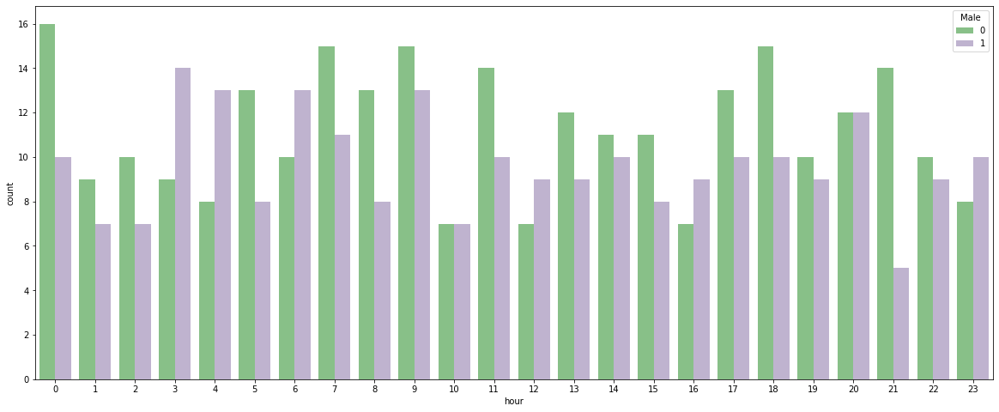

In [53]:
plt.figure(figsize=(20,8))
sns.countplot(x='hour',data=df[df['Clicked on Ad']==1],hue='Male',palette='Accent')
plt.show()

Females seems to be more often in clicking on add

We can check same distribution w.r.t Age ******

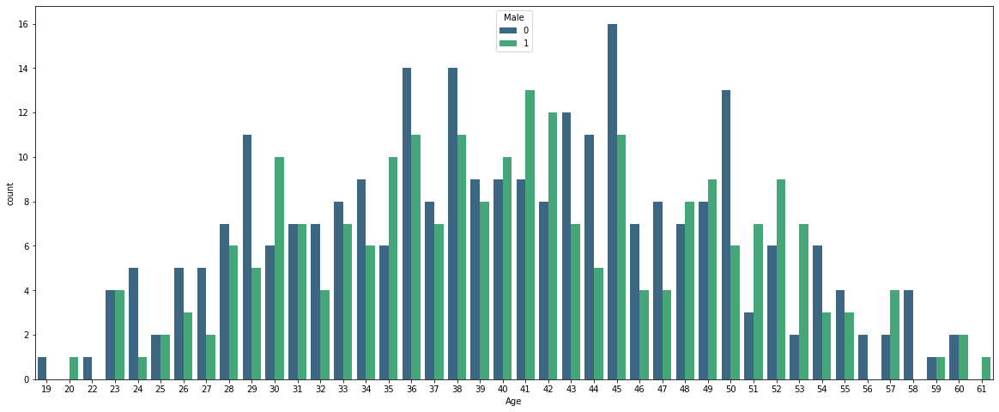

In [54]:
plt.figure(figsize=(20,8))
sns.countplot(x='Age',data=df[df['Clicked on Ad']==1],hue='Male',palette='viridis')
plt.show()

# Same we can see with people not clicking on Ad

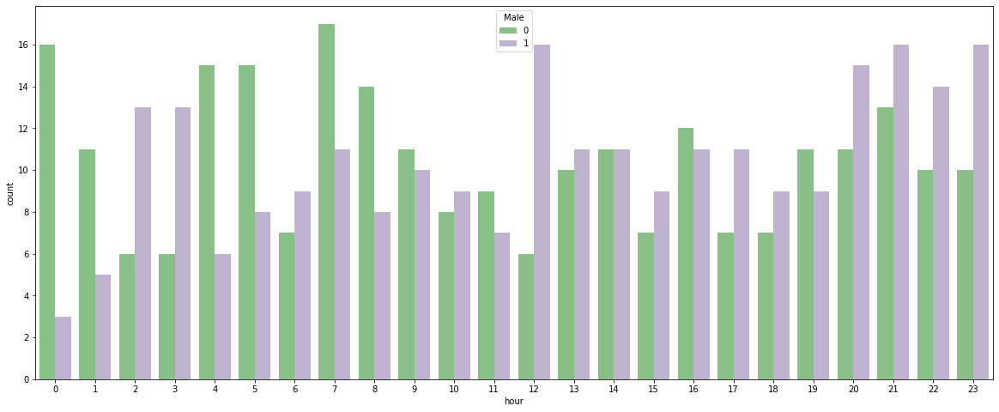

In [55]:
plt.figure(figsize=(20,8))
sns.countplot(x='hour',data=df[df['Clicked on Ad']==0],hue='Male',palette='Accent')
plt.show()

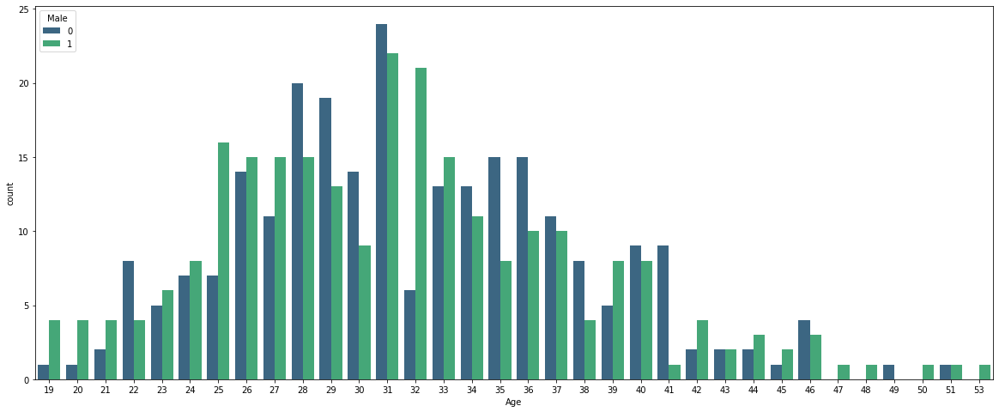

In [56]:
plt.figure(figsize=(20,8))
sns.countplot(x='Age',data=df[df['Clicked on Ad']==0],hue='Male',palette='viridis')
plt.show()

Now we can take help from factorplot to understand the difference carefully

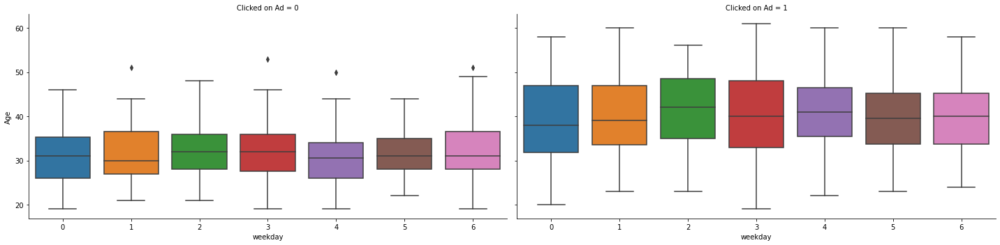

In [57]:
sns.catplot(x='weekday',y='Age',col='Clicked on Ad',data=df,kind='box',size=5,aspect=2.0)

We can say people of higher age are more clicking on an Ad

Just to confirm on above conclusion we will see using month column.

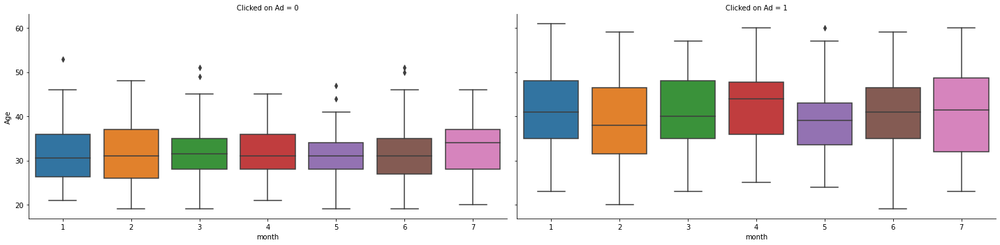

In [58]:
sns.catplot(x='month',y='Age',col='Clicked on Ad',data=df,kind='box',size=5,aspect=2.0)

Above shared conclusion regarding reference of age and clicking is true.

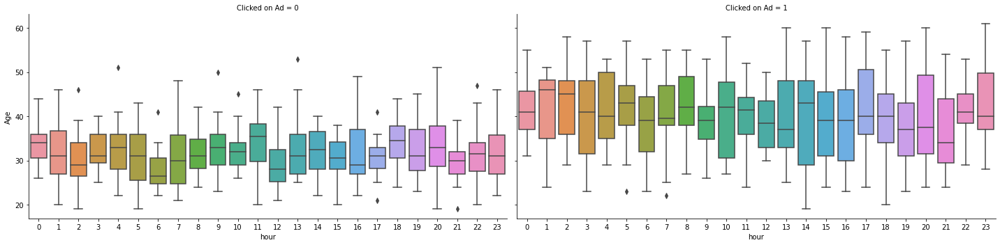

In [59]:
sns.catplot(x='hour',y='Age',col='Clicked on Ad',data=df,kind='box',size=5,aspect=2.0)

Now we will see density plot of Daily internet usage and daily time spent on site.

Text(150, 13, 'Daily internet usage')

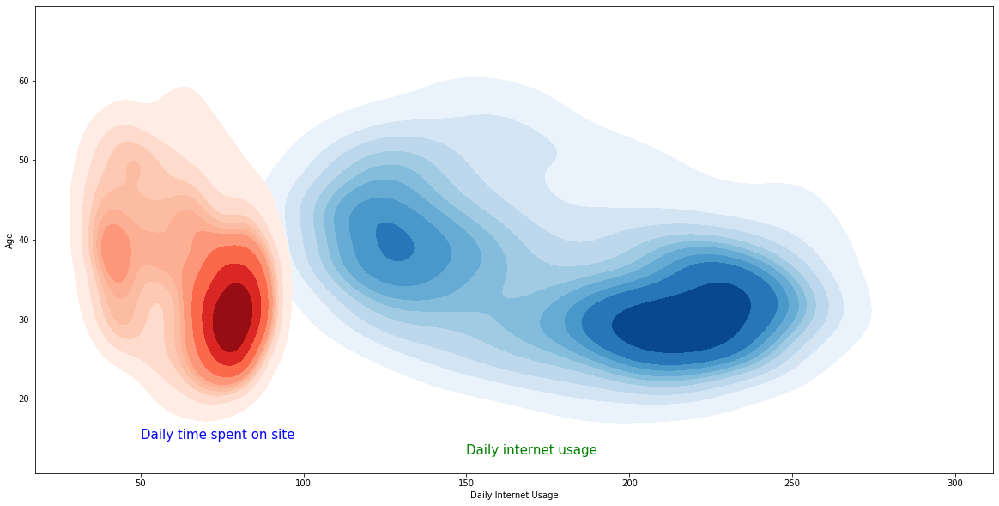

In [60]:
plt.figure(figsize=(20,10))
ax=sns.kdeplot(df['Daily Internet Usage'],df['Age'],cmap='Blues',shade=True)
ax=sns.kdeplot(df['Daily Time Spent on Site'],df['Age'],cmap='Reds',shade=True)
ax.text(50,15,'Daily time spent on site',size=15,color='b')
ax.text(150,13,'Daily internet usage',size=15,color='g')

We can understand from above density plot that:
- People of age 25-34 around using spending more time on site but in our above analysis they are not the highest ads clicker.
- Infact people of 35 to 40 spending less time but are clicking on ads.
- We can say that our product is suitable for 35+ age group or we can target 25 to 35 age group as there are people of this age group who are clicking on add. So, we need to plan some strategy building to fulfill this gap.

In [61]:
df['Ad Topic Line'].nunique()

1000

In [62]:
topics= " ".join(topicline for topicline in df['Ad Topic Line'])

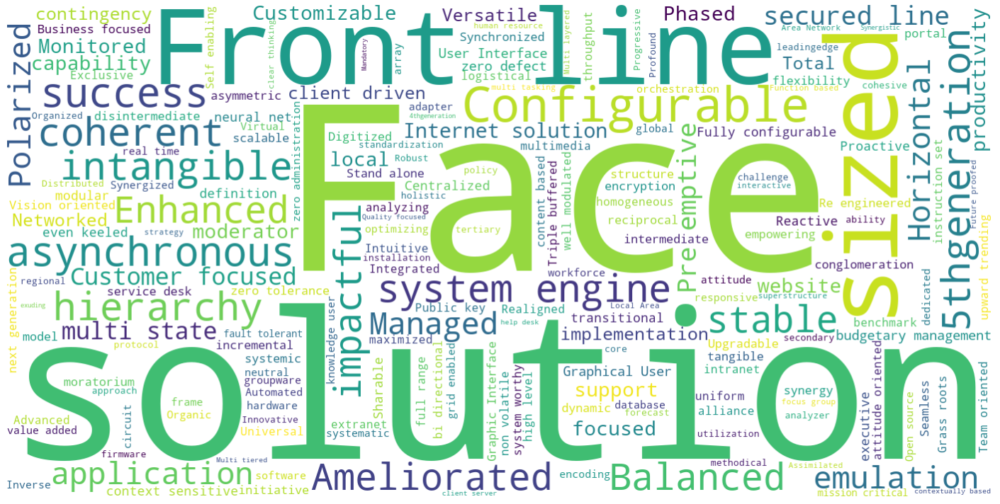

In [63]:
from wordcloud import WordCloud

world_cloud = WordCloud(width=1400, height=700,background_color='white').generate(topics)
plt.figure(figsize=(20, 10))
plt.imshow(world_cloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout()
plt.show()

Distribution and relationship between features.

In [64]:
# Pair plot concept we need to learn

We can also check interdependency of two variable using desnsity plot

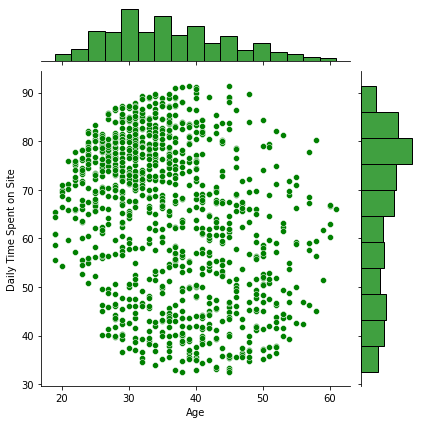

In [65]:
sns.jointplot(x=df['Age'],y=df['Daily Time Spent on Site'],color='green')

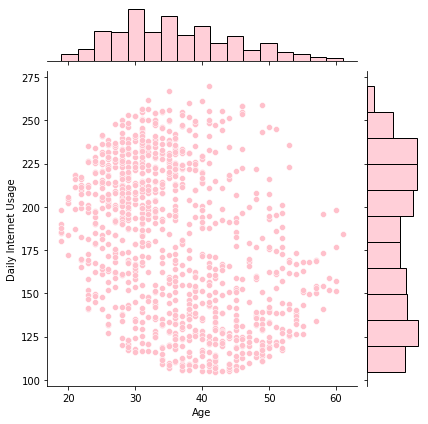

In [66]:
sns.jointplot(x=df['Age'],y=df['Daily Internet Usage'],color='pink')

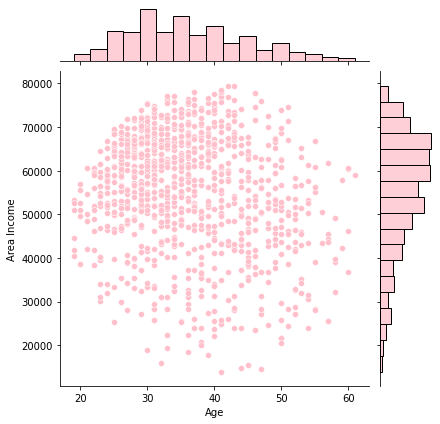

In [67]:
sns.jointplot(x=df['Age'],y=df['Area Income'],color='pink')

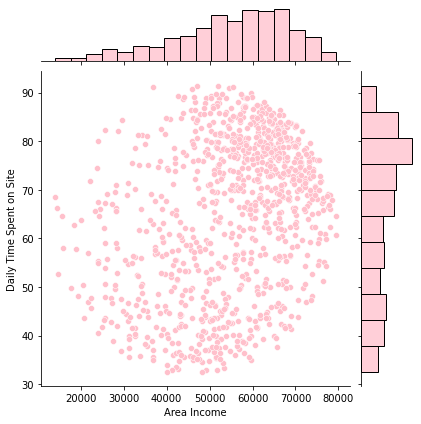

In [68]:
sns.jointplot(y=df['Daily Time Spent on Site'],x=df['Area Income'],color='pink')

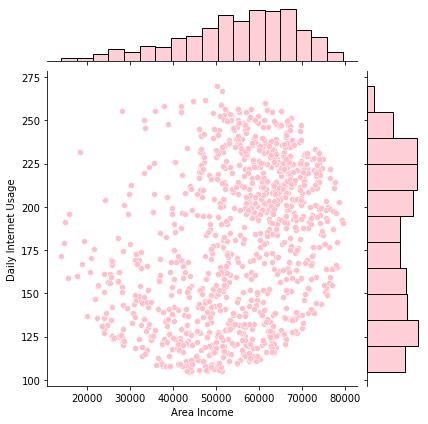

In [69]:
sns.jointplot(y=df['Daily Internet Usage'],x=df['Area Income'],color='pink')

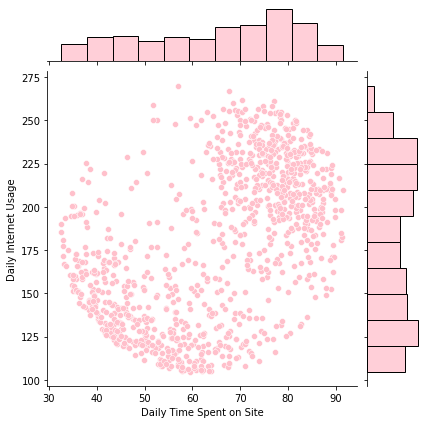

In [70]:
sns.jointplot(y=df['Daily Internet Usage'],x=df['Daily Time Spent on Site'],color='pink')

People having more daily internet usage are spending more time on site

## Now we will see distribution plot and boxplot on continuous variables

In [71]:
numerical_df.head()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad
0,68.95,35,61833.90,256.09,0,0
1,80.23,31,68441.85,193.77,1,0
2,69.47,26,59785.94,236.50,0,0
3,74.15,29,54806.18,245.89,1,0
4,68.37,35,73889.99,225.58,0,0


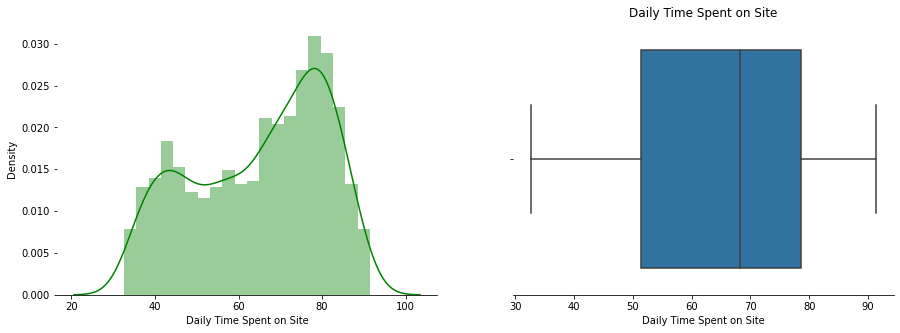

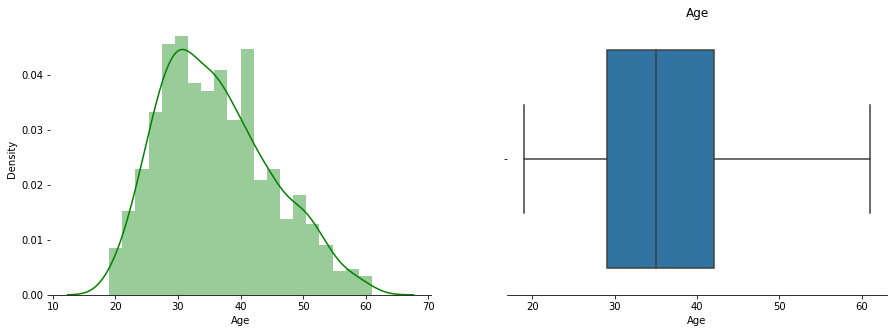

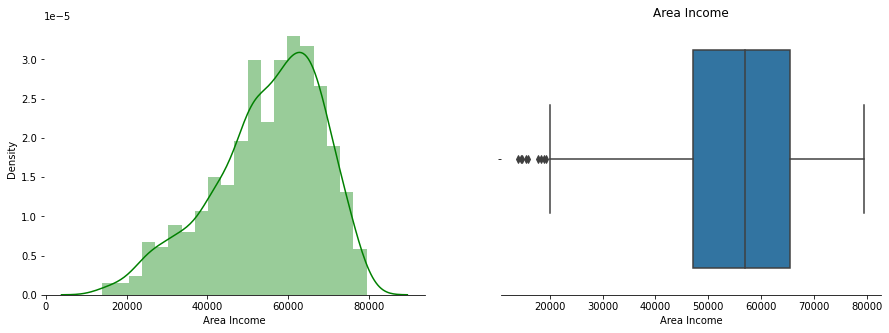

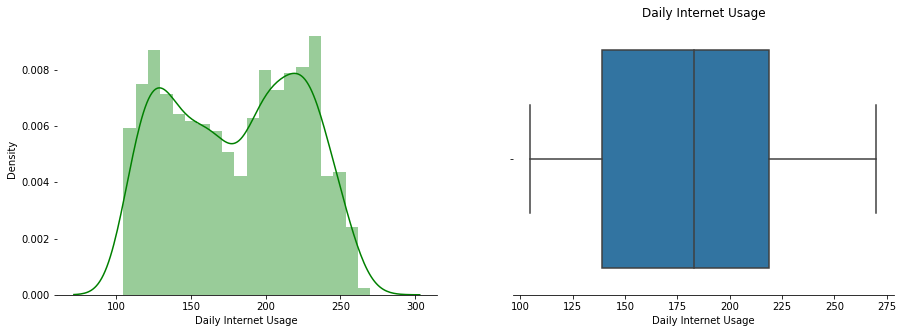

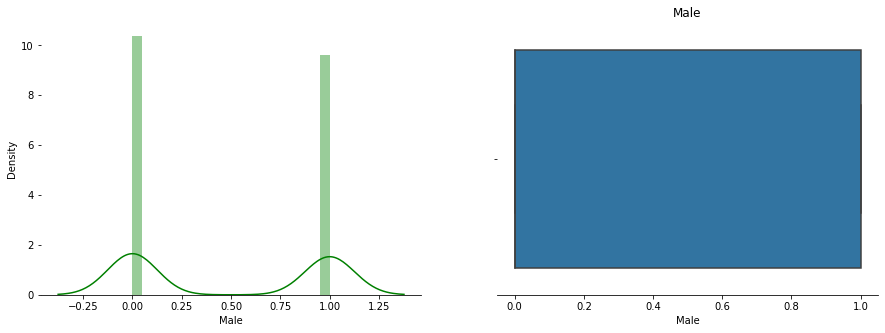

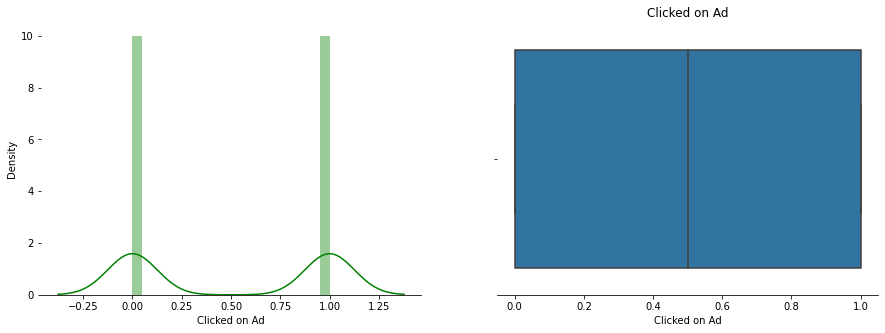

In [72]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 20)

for i in numerical_df:
    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    sns.distplot(df[i],bins=20,color='green')
    plt.subplot(1,2,2)
    sns.boxplot(df[i])
    plt.title(i)
    sns.despine(left=True)

    plt.show()

Till now we have analyzed our data and understand each and every features and there independency to each other visually.

# Now we will apply some statistical test to understand dependency on each parameter
- Also with the results we will do some feature engineering and feature extraction 

In [73]:
df.corr()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad,month,day,hour,weekday
Daily Time Spent on Site,1.000000,-0.331513,0.310954,0.518658,-0.018951,-0.748117,-0.010920,-0.011217,0.000895,0.018336
Age,-0.331513,1.000000,-0.182605,-0.367209,-0.021044,0.492531,0.023689,-0.038162,-0.049905,0.013593
Area Income,0.310954,-0.182605,1.000000,0.337496,0.001322,-0.476255,-0.050216,-0.026523,0.034573,0.013879
Daily Internet Usage,0.518658,-0.367209,0.337496,1.000000,0.028012,-0.786539,0.017530,-0.012531,0.074347,0.009035
Male,-0.018951,-0.021044,0.001322,0.028012,1.000000,-0.038027,0.005220,-0.013253,0.058552,-0.038861
Clicked on Ad,-0.748117,0.492531,-0.476255,-0.786539,-0.038027,1.000000,0.016095,-0.005269,-0.047431,0.002003
month,-0.010920,0.023689,-0.050216,0.017530,0.005220,0.016095,1.000000,-0.017274,-0.013748,-0.020090
day,-0.011217,-0.038162,-0.026523,-0.012531,-0.013253,-0.005269,-0.017274,1.000000,-0.017064,0.041235
hour,0.000895,-0.049905,0.034573,0.074347,0.058552,-0.047431,-0.013748,-0.017064,1.000000,0.007034
weekday,0.018336,0.013593,0.013879,0.009035,-0.038861,0.002003,-0.020090,0.041235,0.007034,1.000000


Now, we will check how much dependency each parameter is having with target variable.
- Lets check normality of our numerical features.

In [74]:
numerical_cols= numerical_df.drop(columns=["Clicked on Ad","Male"])
numerical_cols

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage
0,68.95,35,61833.90,256.09
1,80.23,31,68441.85,193.77
2,69.47,26,59785.94,236.50
3,74.15,29,54806.18,245.89
4,68.37,35,73889.99,225.58
5,59.99,23,59761.56,226.74
6,88.91,33,53852.85,208.36
7,66.00,48,24593.33,131.76
8,74.53,30,68862.00,221.51
9,69.88,20,55642.32,183.82


Lets do Outlier treatment

Hypothesis Testing:
- Null Hypothesiis
- H0 - Data is normally distributed

- Alternate hypothesis
- H1 - Data is not normally distributed

- Sigificance value alpha = 0.05

In [75]:
from scipy.stats import shapiro
alpha=0.05

for col in numerical_cols:
    statistic, p_value = shapiro(numerical_cols[col])
    print("Shapiro wilk test for column :", col)
    print("Statistic value :" ,statistic)
    print("P value of ",col,p_value)
    print(end=" ")
    if p_value<alpha:
        print("Null hypothesis has been rejected data is not normally distributed.")
    else:
        print("Null hypothesis has been accepted data is normally distributed.")
    print("")    


Shapiro wilk test for column : Daily Time Spent on Site
Statistic value : 0.9407330751419067
P value of  Daily Time Spent on Site 1.518221642693576e-19
 Null hypothesis has been rejected data is not normally distributed.

Shapiro wilk test for column : Age
Statistic value : 0.9732874631881714
P value of  Age 1.3369288315301375e-12
 Null hypothesis has been rejected data is not normally distributed.

Shapiro wilk test for column : Area Income
Statistic value : 0.9629443287849426
P value of  Area Income 2.989683467222279e-15
 Null hypothesis has been rejected data is not normally distributed.

Shapiro wilk test for column : Daily Internet Usage
Statistic value : 0.9490271210670471
P value of  Daily Internet Usage 4.198121934080152e-18
 Null hypothesis has been rejected data is not normally distributed.



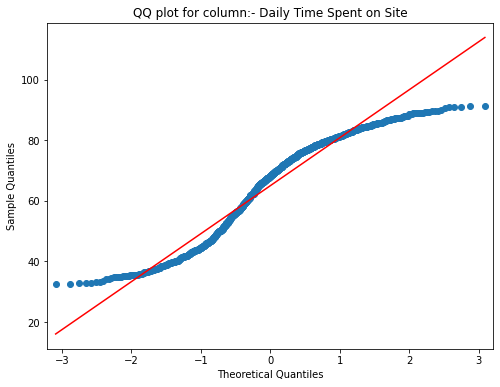

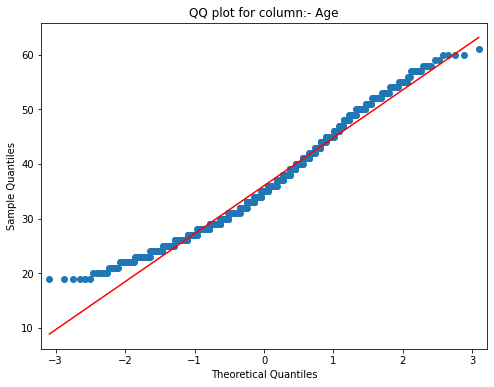

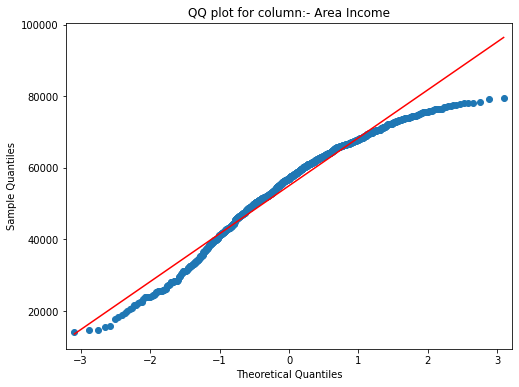

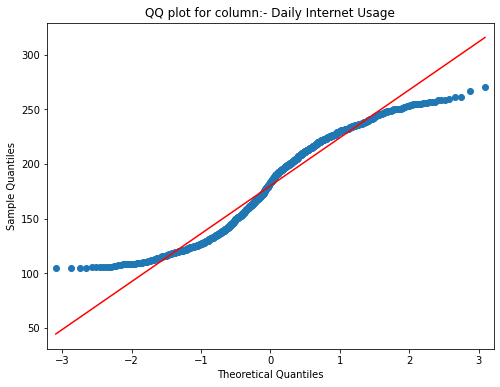

In [76]:
import statsmodels.api as sm
for col in numerical_cols:
    plt.figure(figsize=(8,6))
    fig=sm.qqplot(numerical_cols[col],line='s',ax=plt.gca())
    plt.title(f"QQ plot for column:- {col}")
    plt.show()

# Conclusion:
- From Saphiro-wilk test it is observed that Data is not normally distributed.
- Also with QQ plot we can say data is not normally distributed.

Now, We will check relation between two parameters either they are dependent or independent to Target columns.

In [77]:
# As our target column is categorical.So, we will go with annova-test and spearman correlation
from scipy.stats import spearmanr, f_oneway

for col in numerical_cols:
    spearman_corr, spearman_p_value=spearmanr(numerical_cols[col],df['Clicked on Ad'])
    print("correlation of :-",col)
    print('spearman correlation : ',spearman_corr)
    print("P-Value : ",spearman_p_value)
    

correlation of :- Daily Time Spent on Site
spearman correlation :  -0.7448725321410691
P-Value :  1.38604622620038e-177
correlation of :- Age
spearman correlation :  0.48633733394097906
P-Value :  1.6936993356003423e-60
correlation of :- Area Income
spearman correlation :  -0.4672244030555797
P-Value :  2.283447860153031e-55
correlation of :- Daily Internet Usage
spearman correlation :  -0.7766070163104524
P-Value :  1.75214193224148e-202


Conclusion from above result

Daily Time Spent on Site:

Spearman correlation coefficient: -0.7449
P-value: 1.386e-177
Interpretation: The strong negative monotonic relationship suggests that there is a significant association between the daily time spent on the site and the likelihood of clicking on the advertisement. Specifically, as the daily time spent on the site increases, the likelihood of clicking on the advertisement tends to decrease. This could indicate that users who spend less time on the site are more likely to click on the advertisement.
Age:

Spearman correlation coefficient: 0.4863
P-value: 1.694e-60
Interpretation: The moderate positive monotonic relationship suggests that there is a significant association between age and the likelihood of clicking on the advertisement. As age increases, the likelihood of clicking on the advertisement tends to increase. This could imply that older users are more likely to click on the advertisement compared to younger users.
Area Income:

Spearman correlation coefficient: -0.4672
P-value: 2.283e-55
Interpretation: The moderate negative monotonic relationship indicates that there is a significant association between area income and the likelihood of clicking on the advertisement. As area income increases, the likelihood of clicking on the advertisement tends to decrease. This suggests that users from higher-income areas are less likely to click on the advertisement.
Daily Internet Usage:

Spearman correlation coefficient: -0.7766
P-value: 1.752e-202
Interpretation: The strong negative monotonic relationship suggests that there is a significant association between daily internet usage and the likelihood of clicking on the advertisement. As daily internet usage increases, the likelihood of clicking on the advertisement tends to decrease. This implies that users who spend more time on the internet are less likely to click on the advertisement.
These interpretations provide insights into the relationships between the predictor variables (daily time spent on site, age, area income, daily internet usage) and the likelihood of clicking on the advertisement, as indicated by the binary target variable.


# Now we will transform our numerical columns into normally distribution

In [78]:
logdata = numerical_cols.copy()

for col in numerical_cols:
    logdata[col]=np.log(numerical_cols[col])
    
logdata    

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage
0,4.233382,3.555348,11.032207,5.545529
1,4.384898,3.433987,11.133740,5.266672
2,4.240895,3.258097,10.998526,5.465948
3,4.306090,3.367296,10.911558,5.504884
4,4.224934,3.555348,11.210333,5.418675
5,4.094178,3.135494,10.998118,5.423804
6,4.487625,3.496508,10.894011,5.339267
7,4.189655,3.871201,10.110231,4.880982
8,4.311202,3.401197,11.139860,5.400468
9,4.246779,2.995732,10.926699,5.213957


In [79]:
for col in logdata:
    spearman_corr, spearman_p_value=spearmanr(logdata[col],df['Clicked on Ad'])
    print("correlation of :-",col)
    print('spearman correlation : ',spearman_corr)
    print("P-Value : ",spearman_p_value)

correlation of :- Daily Time Spent on Site
spearman correlation :  -0.7448725321410691
P-Value :  1.38604622620038e-177
correlation of :- Age
spearman correlation :  0.48633733394097906
P-Value :  1.6936993356003423e-60
correlation of :- Area Income
spearman correlation :  -0.4672244030555797
P-Value :  2.283447860153031e-55
correlation of :- Daily Internet Usage
spearman correlation :  -0.7766070163104524
P-Value :  1.75214193224148e-202


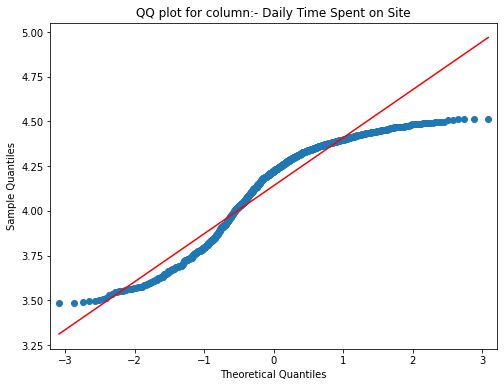

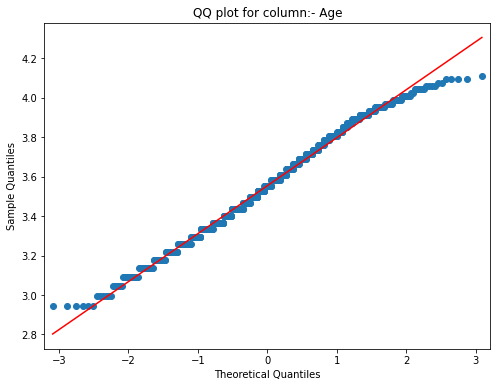

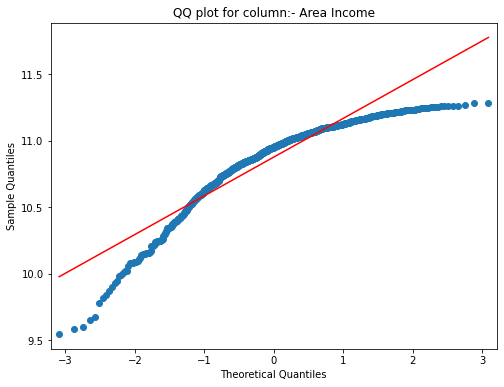

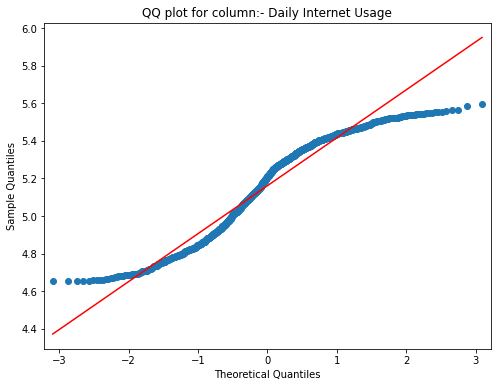

In [80]:
for col in logdata:
    plt.figure(figsize=(8,6))
    fig=sm.qqplot(logdata[col],line='s',ax=plt.gca())
    plt.title(f"QQ plot for column:- {col}")
    plt.show()

After applying log transformation correlation between the parameters and target variables remain same.
- We need to figure out by diving deep into it.

# Annova test

In [81]:
target=df['Clicked on Ad']
for col in numerical_cols:
    group=[numerical_cols[col][target==category] for category in target.unique()]
    anova_statistic, anova_p_value = f_oneway(*group)
    print("ANOVA F-statistic for", col, ":", anova_statistic)
    print("P-value for ANOVA for", col, ":", anova_p_value)

ANOVA F-statistic for Daily Time Spent on Site : 1268.5251609065565
P-value for ANOVA for Daily Time Spent on Site : 5.8773842441386545e-180
ANOVA F-statistic for Age : 319.64316516119794
P-value for ANOVA for Age : 3.1298083092905155e-62
ANOVA F-statistic for Area Income : 292.77061672340784
P-value for ANOVA for Area Income : 9.44958341282883e-58
ANOVA F-statistic for Daily Internet Usage : 1618.9764559901425
P-value for ANOVA for Daily Internet Usage : 3.8932341225400295e-211


# Now we will check same test with transformed data

In [82]:
target=df['Clicked on Ad']
for col in logdata:
    group=[logdata[col][target==category] for category in target.unique()]
    anova_statistic, anova_p_value = f_oneway(*group)
    print("ANOVA F-statistic for", col, ":", anova_statistic)
    print("P-value for ANOVA for", col, ":", anova_p_value)
    print()

ANOVA F-statistic for Daily Time Spent on Site : 1143.9818761855477
P-value for ANOVA for Daily Time Spent on Site : 1.064501412882339e-167

ANOVA F-statistic for Age : 303.13193606476796
P-value for ANOVA for Age : 1.725780856368387e-59

ANOVA F-statistic for Area Income : 275.76341191681973
P-value for ANOVA for Area Income : 7.241494466667772e-55

ANOVA F-statistic for Daily Internet Usage : 1606.3080077815844
P-value for ANOVA for Daily Internet Usage : 4.391244698078333e-210



Daily Time Spent on Site:

Interpretation: Users who spend different amounts of time on the site are likely to have different propensities to click on the advertisement. Even after transforming the data into a log-normal distribution, there are still significant differences in the mean daily time spent on the site across different categories of users (clicked on advertisement or not). This suggests that the transformed daily time spent on the site remains associated with the likelihood of clicking on the advertisement. For example, users who spend more time on the site may be less likely to click on the advertisement compared to those who spend less time.
Age:

Interpretation: Different age groups of users are likely to have different propensities to click on the advertisement. Even after transformation, there are significant differences in the mean age across different categories of users. This suggests that the transformed age variable remains associated with the likelihood of clicking on the advertisement. For example, older users may be more or less likely to click on the advertisement compared to younger users.
Area Income:

Interpretation: Users from different income brackets are likely to have different propensities to click on the advertisement. Even after transformation, there are significant differences in the mean area income across different categories of users. This suggests that the transformed area income variable remains associated with the likelihood of clicking on the advertisement. For example, users from higher-income areas may be more or less likely to click on the advertisement compared to those from lower-income areas.
Daily Internet Usage:

Interpretation: Users who spend different amounts of time on the internet daily are likely to have different propensities to click on the advertisement. Even after transformation, there are significant differences in the mean daily internet usage across different categories of users. This suggests that the transformed daily internet usage variable remains associated with the likelihood of clicking on the advertisement. For example, users who spend more time on the internet daily may be more or less likely to click on the advertisement compared to those who spend less time.
In summary, even after transforming the numerical features into a log-normal distribution, they remain significantly associated with the likelihood of clicking on the advertisement. Users' behavior, demographics, and internet usage patterns all appear to influence their propensity to click on the advertisement.

# Let's check corr. between numerical columns.


In [83]:
correlation_matrix=pd.DataFrame(numerical_cols.corr())
correlation_matrix

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage
Daily Time Spent on Site,1.000000,-0.331513,0.310954,0.518658
Age,-0.331513,1.000000,-0.182605,-0.367209
Area Income,0.310954,-0.182605,1.000000,0.337496
Daily Internet Usage,0.518658,-0.367209,0.337496,1.000000


Daily Time Spent on Site:

Positive correlation with Daily Internet Usage (0.5187): This suggests that there is a moderate positive linear relationship between the daily time spent on the site and the daily internet usage. Users who spend more time on the site tend to also spend more time on the internet.

Negative correlation with Age (-0.3315): This indicates a weak negative linear relationship between the daily time spent on the site and the age of users. It suggests that younger users may spend more time on the site compared to older users, but the correlation is not very strong.

Positive correlation with Area Income (0.3110): There is a weak positive linear relationship between the daily time spent on the site and the area income. It suggests that users from areas with higher income levels may spend slightly more time on the site.

Age:

Negative correlation with Daily Internet Usage (-0.3672): This indicates a moderate negative linear relationship between the age of users and their daily internet usage. Younger users tend to spend more time on the internet compared to older users.

Negative correlation with Daily Time Spent on Site (-0.3315): Similar to the above, there is a weak negative linear relationship between the age of users and the daily time spent on the site. Younger users may spend slightly more time on the site compared to older users.

Area Income:

Positive correlation with Daily Internet Usage (0.3375): There is a weak positive linear relationship between the area income and the daily internet usage of users. Users from areas with higher income levels tend to spend slightly more time on the internet.

Positive correlation with Daily Time Spent on Site (0.3110): Similarly, there is a weak positive linear relationship between the area income and the daily time spent on the site. Users from areas with higher income levels may spend slightly more time on the site.

Daily Internet Usage:

Positive correlation with Daily Time Spent on Site (0.5187): This suggests a moderate positive linear relationship between the daily internet usage and the daily time spent on the site. Users who spend more time on the internet also tend to spend more time on the site.

Negative correlation with Age (-0.3672): As mentioned earlier, there is a moderate negative linear relationship between the daily internet usage and the age of users. Younger users tend to spend more time on the internet compared to older users.

In [84]:
correlation_matrix=pd.DataFrame(numerical_cols.corr(method='spearman'))
correlation_matrix

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage
Daily Time Spent on Site,1.000000,-0.316862,0.283134,0.514108
Age,-0.316862,1.000000,-0.135954,-0.370864
Area Income,0.283134,-0.135954,1.000000,0.339160
Daily Internet Usage,0.514108,-0.370864,0.339160,1.000000


Daily Time Spent on Site:

Positive correlation with Daily Internet Usage (0.5141): There is a moderate positive monotonic relationship between the daily time spent on the site and the daily internet usage. Users who spend more time on the site tend to also spend more time on the internet.

Negative correlation with Age (-0.3169): This indicates a moderate negative monotonic relationship between the daily time spent on the site and the age of users. It suggests that younger users may spend slightly more time on the site compared to older users, but the correlation is not very strong.

Positive correlation with Area Income (0.2831): There is a weak positive monotonic relationship between the daily time spent on the site and the area income. It suggests that users from areas with higher income levels may spend slightly more time on the site.

Age:

Negative correlation with Daily Internet Usage (-0.3709): There is a moderate negative monotonic relationship between the age of users and their daily internet usage. Younger users tend to spend more time on the internet compared to older users.

Negative correlation with Daily Time Spent on Site (-0.3169): Similarly, there is a moderate negative monotonic relationship between the age of users and the daily time spent on the site. Younger users may spend slightly more time on the site compared to older users.

Area Income:

Positive correlation with Daily Internet Usage (0.3392): There is a weak positive monotonic relationship between the area income and the daily internet usage of users. Users from areas with higher income levels tend to spend slightly more time on the internet.

Positive correlation with Daily Time Spent on Site (0.2831): Similarly, there is a weak positive monotonic relationship between the area income and the daily time spent on the site. Users from areas with higher income levels may spend slightly more time on the site.

Daily Internet Usage:

Positive correlation with Daily Time Spent on Site (0.5141): There is a moderate positive monotonic relationship between the daily internet usage and the daily time spent on the site. Users who spend more time on the internet also tend to spend more time on the site.

Negative correlation with Age (-0.3709): As mentioned earlier, there is a moderate negative monotonic relationship between the daily internet usage and the age of users. Younger users tend to spend more time on the internet compared to older users.

# Lets check for categorical variables

In [85]:
categorical_df.columns

Index(['Ad Topic Line', 'City', 'Country'], dtype='object')

In [86]:
from scipy.stats import chi2_contingency
cattable=pd.crosstab(index=[df['Ad Topic Line']],columns=df['Clicked on Ad'])
chi2, p_value, dof, expected = chi2_contingency(cattable)
print("chi-vale : ",chi2)
print("Pvalue : ",p_value)
print("degree of freedon : ",dof)
print("expected value : ",expected)

chi-vale :  1000.0
Pvalue :  0.48513148927490146
degree of freedon :  999
expected value :  [[0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 ...
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]]


In [87]:
from scipy.stats import chi2_contingency
cattable=pd.crosstab(index=[df['City']],columns=df['Clicked on Ad'])
chi2, p_value, dof, expected = chi2_contingency(cattable)
print("chi-vale : ",chi2)
print("Pvalue : ",p_value)
print("degree of freedon : ",dof)
print("expected value : ",expected)

chi-vale :  974.6666666666666
Pvalue :  0.43395559179296705
degree of freedon :  968
expected value :  [[0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 ...
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]]


In [88]:
from scipy.stats import chi2_contingency
cattable=pd.crosstab(index=[df['Country']],columns=df['Clicked on Ad'])
chi2, p_value, dof, expected = chi2_contingency(cattable)
print("chi-vale : ",chi2)
print("Pvalue : ",p_value)
print("degree of freedon : ",dof)


chi-vale :  219.41269841269843
Pvalue :  0.7737565395501932
degree of freedon :  236


In [89]:
from scipy.stats import chi2_contingency
cattable=pd.crosstab(index=[df['Male']],columns=df['Clicked on Ad'])
chi2, p_value, dof, expected = chi2_contingency(cattable)
print("chi-vale : ",chi2)
print("Pvalue : ",p_value)
print("degree of freedon : ",dof)

chi-vale :  1.2978741302440726
Pvalue :  0.2546019035670961
degree of freedon :  1


# conclusion for all above steps.
- Certainly! Here's a combined interpretation of the chi-square test results:

The chi-square test of independence was conducted to determine whether there is a significant association between gender (Male) and clicking on the advertisement. The results indicate that:

- The chi-square value is 1.2979.
- The p-value is 0.2546.
- The degrees of freedom is 1.

Since the p-value (0.2546) is greater than the chosen significance level (e.g., 0.05), we fail to reject the null hypothesis of independence. This means that there is not enough evidence to conclude that there is a significant association between gender (Male) and clicking on the advertisement. The chi-square value of 1.2979 suggests a discrepancy between the observed and expected frequencies in the contingency table, but this discrepancy is likely due to random chance rather than a true association between gender and clicking on the advertisement. Therefore, based on the chi-square test results, we do not have sufficient evidence to conclude that there is an association between gender and clicking on the advertisement.

In [90]:
for col in numerical_cols:
    means_ = []

    for clicked in [0, 1]:
        mean = np.mean(
            df[df['Clicked on Ad'] == clicked][col]
        )
        means_.append(mean)

        if clicked:
            print(f'Mean for {col} of clicked: {mean}')
        else:
            print(f'Mean for {col} of non clicked: {mean}')
            
        
    print(f'Differences in Mean: {round(abs(means_[0] - means_[1]), 2)}\n')

Mean for Daily Time Spent on Site of non clicked: 76.85462
Mean for Daily Time Spent on Site of clicked: 53.14578
Differences in Mean: 23.71

Mean for Age of non clicked: 31.684
Mean for Age of clicked: 40.334
Differences in Mean: 8.65

Mean for Area Income of non clicked: 61385.58642
Mean for Area Income of clicked: 48614.413739999996
Differences in Mean: 12771.17

Mean for Daily Internet Usage of non clicked: 214.51373999999998
Mean for Daily Internet Usage of clicked: 145.48646000000002
Differences in Mean: 69.03



For the feature "Daily Time Spent on Site":

Mean for non-clicked: 76.85
Mean for clicked: 53.15
Difference in means: 23.71
Interpretation: On average, users who clicked on the advertisement spent approximately 23.71 units less time on the site compared to those who did not click.
- For the feature "Age":

Mean for non-clicked: 31.68
Mean for clicked: 40.33
Difference in means: 8.65
Interpretation: On average, users who clicked on the advertisement are approximately 8.65 years older than those who did not click.
- For the feature "Area Income":

Mean for non-clicked: 61385.59
Mean for clicked: 48614.41
Difference in means: 12771.17
Interpretation: On average, users who clicked on the advertisement have an area income approximately 12771.17 units lower than those who did not click.
- For the feature "Daily Internet Usage":

Mean for non-clicked: 214.51
Mean for clicked: 145.49
Difference in means: 69.03
Interpretation: On average, users who clicked on the advertisement spent approximately 69.03 units less time on the internet daily compared to those who did not click.

In [91]:
for col in numerical_cols:
    vars_ = []

    for clicked in [0, 1]:
        var = np.var(
            df[df['Clicked on Ad'] == clicked][col],
            ddof=1
        )
        vars_.append(var)

        if clicked:
            print(f'Sample variance for {col} of clicked: {var}')
        else:
            print(f'Sample variance for {col} of non clicked: {var}')
            
        
    print(f'Differences in Variance: {round(abs(vars_[0] - vars_[1]), 2)}\n')

Sample variance for Daily Time Spent on Site of non clicked: 57.15407580721443
Sample variance for Daily Time Spent on Site of clicked: 164.40601281723448
Differences in Variance: 107.25

Sample variance for Age of non clicked: 38.60134669338677
Sample variance for Age of clicked: 78.43932264529057
Differences in Variance: 39.84

Sample variance for Area Income of non clicked: 79282287.69250278
Sample variance for Area Income of clicked: 199268294.7528459
Differences in Variance: 119986007.06

Sample variance for Daily Internet Usage of non clicked: 569.9861196517033
Sample variance for Daily Internet Usage of clicked: 901.5502225134269
Differences in Variance: 331.56



- Daily Time Spent on Site:

Sample variance for non-clicked: 57.15
Sample variance for clicked: 164.41
Difference in variance: 107.25
Interpretation: The variance in daily time spent on the site is substantially higher for users who clicked on the advertisement compared to those who did not. This suggests that there is greater variability in the daily time spent on the site among users who clicked on the advertisement.
- Age:

Sample variance for non-clicked: 38.60
Sample variance for clicked: 78.44
Difference in variance: 39.84
Interpretation: Similarly, the variance in age is higher for users who clicked on the advertisement compared to those who did not. This indicates greater variability in the ages of users who clicked on the advertisement.
- Area Income:

Sample variance for non-clicked: 79282287.69
Sample variance for clicked: 199268294.75
Difference in variance: 119986007.06
Interpretation: The variance in area income is substantially higher for users who clicked on the advertisement compared to those who did not. This suggests greater variability in the area income of users who clicked on the advertisement.
- Daily Internet Usage:

Sample variance for non-clicked: 569.99
Sample variance for clicked: 901.55
Difference in variance: 331.56
Interpretation: Similarly, the variance in daily internet usage is higher for users who clicked on the advertisement compared to those who did not. This indicates greater variability in the daily internet usage of users who clicked on the advertisement.
Overall, the differences in variance provide insights into the variability of the numerical features within each group, helping to identify potential patterns or differences between users who clicked on the advertisement and those who did not.

# We have completed our statistical tests and analysis

# Feature Engineering

In [92]:
df.isnull().sum()

Daily Time Spent on Site    0
Age                         0
Area Income                 0
Daily Internet Usage        0
Ad Topic Line               0
City                        0
Male                        0
Country                     0
Timestamp                   0
Clicked on Ad               0
month                       0
day                         0
hour                        0
weekday                     0
dtype: int64

In [93]:
df.dtypes

Daily Time Spent on Site           float64
Age                                  int64
Area Income                        float64
Daily Internet Usage               float64
Ad Topic Line                       object
City                                object
Male                                 int64
Country                             object
Timestamp                   datetime64[ns]
Clicked on Ad                        int64
month                                int64
day                                  int64
hour                                 int64
weekday                              int64
dtype: object

In [94]:
df.drop(['Timestamp'],axis=1,inplace=True)

In [95]:
df

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Ad Topic Line,City,Male,Country,Clicked on Ad,month,day,hour,weekday
0,68.95,35,61833.90,256.09,Cloned 5thgeneration orchestration,Wrightburgh,0,Tunisia,0,3,27,0,6
1,80.23,31,68441.85,193.77,Monitored national standardization,West Jodi,1,Nauru,0,4,4,1,0
2,69.47,26,59785.94,236.50,Organic bottom-line service-desk,Davidton,0,San Marino,0,3,13,20,6
3,74.15,29,54806.18,245.89,Triple-buffered reciprocal time-frame,West Terrifurt,1,Italy,0,1,10,2,6
4,68.37,35,73889.99,225.58,Robust logistical utilization,South Manuel,0,Iceland,0,6,3,3,4
5,59.99,23,59761.56,226.74,Sharable client-driven software,Jamieberg,1,Norway,0,5,19,14,3
6,88.91,33,53852.85,208.36,Enhanced dedicated support,Brandonstad,0,Myanmar,0,1,28,20,3
7,66.00,48,24593.33,131.76,Reactive local challenge,Port Jefferybury,1,Australia,1,3,7,1,0
8,74.53,30,68862.00,221.51,Configurable coherent function,West Colin,1,Grenada,0,4,18,9,0
9,69.88,20,55642.32,183.82,Mandatory homogeneous architecture,Ramirezton,1,Ghana,0,7,11,1,0


In [96]:
# Lets delete Ad Topc line and City data because we have seen that there are unique percentage is more than 95%

df1=df.drop(['Ad Topic Line','City'],axis=1)
df1

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Country,Clicked on Ad,month,day,hour,weekday
0,68.95,35,61833.90,256.09,0,Tunisia,0,3,27,0,6
1,80.23,31,68441.85,193.77,1,Nauru,0,4,4,1,0
2,69.47,26,59785.94,236.50,0,San Marino,0,3,13,20,6
3,74.15,29,54806.18,245.89,1,Italy,0,1,10,2,6
4,68.37,35,73889.99,225.58,0,Iceland,0,6,3,3,4
5,59.99,23,59761.56,226.74,1,Norway,0,5,19,14,3
6,88.91,33,53852.85,208.36,0,Myanmar,0,1,28,20,3
7,66.00,48,24593.33,131.76,1,Australia,1,3,7,1,0
8,74.53,30,68862.00,221.51,1,Grenada,0,4,18,9,0
9,69.88,20,55642.32,183.82,1,Ghana,0,7,11,1,0


In [97]:
# As we now have 237 unique parameters in our countries, So either we can group them continent wise but because of less data, we will ignore it for now.

df1=df1.drop('Country',axis=1)
df1

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad,month,day,hour,weekday
0,68.95,35,61833.90,256.09,0,0,3,27,0,6
1,80.23,31,68441.85,193.77,1,0,4,4,1,0
2,69.47,26,59785.94,236.50,0,0,3,13,20,6
3,74.15,29,54806.18,245.89,1,0,1,10,2,6
4,68.37,35,73889.99,225.58,0,0,6,3,3,4
5,59.99,23,59761.56,226.74,1,0,5,19,14,3
6,88.91,33,53852.85,208.36,0,0,1,28,20,3
7,66.00,48,24593.33,131.76,1,1,3,7,1,0
8,74.53,30,68862.00,221.51,1,0,4,18,9,0
9,69.88,20,55642.32,183.82,1,0,7,11,1,0


In [98]:
# month and day Can be of no use untill and unless its a time series problem
df1=df1.drop(['month','day'],axis=1)
df1

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad,hour,weekday
0,68.95,35,61833.90,256.09,0,0,0,6
1,80.23,31,68441.85,193.77,1,0,1,0
2,69.47,26,59785.94,236.50,0,0,20,6
3,74.15,29,54806.18,245.89,1,0,2,6
4,68.37,35,73889.99,225.58,0,0,3,4
5,59.99,23,59761.56,226.74,1,0,14,3
6,88.91,33,53852.85,208.36,0,0,20,3
7,66.00,48,24593.33,131.76,1,1,1,0
8,74.53,30,68862.00,221.51,1,0,9,0
9,69.88,20,55642.32,183.82,1,0,1,0


In [99]:
# As we have seen distribution of weekday is a goood fit for model having only few distinct values.
# But, we will bin the hour column and generate dummy variables.

# Binning hour column nd generationg dummy variables.

df1['binned hours']=pd.cut(df1['hour'],bins=[-1,5,11,17,24],labels=['1-6','7-12','13-18','18-24'])
df1

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad,hour,weekday,binned hours
0,68.95,35,61833.90,256.09,0,0,0,6,1-6
1,80.23,31,68441.85,193.77,1,0,1,0,1-6
2,69.47,26,59785.94,236.50,0,0,20,6,18-24
3,74.15,29,54806.18,245.89,1,0,2,6,1-6
4,68.37,35,73889.99,225.58,0,0,3,4,1-6
5,59.99,23,59761.56,226.74,1,0,14,3,13-18
6,88.91,33,53852.85,208.36,0,0,20,3,18-24
7,66.00,48,24593.33,131.76,1,1,1,0,1-6
8,74.53,30,68862.00,221.51,1,0,9,0,7-12
9,69.88,20,55642.32,183.82,1,0,1,0,1-6


In [100]:
# Getting dummy variables
encoded_hours = pd.get_dummies(df1['binned hours'], prefix='hour')
df_encoded = pd.concat([df1, encoded_hours], axis=1)
df_encoded

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad,hour,weekday,binned hours,hour_1-6,hour_7-12,hour_13-18,hour_18-24
0,68.95,35,61833.90,256.09,0,0,0,6,1-6,1,0,0,0
1,80.23,31,68441.85,193.77,1,0,1,0,1-6,1,0,0,0
2,69.47,26,59785.94,236.50,0,0,20,6,18-24,0,0,0,1
3,74.15,29,54806.18,245.89,1,0,2,6,1-6,1,0,0,0
4,68.37,35,73889.99,225.58,0,0,3,4,1-6,1,0,0,0
5,59.99,23,59761.56,226.74,1,0,14,3,13-18,0,0,1,0
6,88.91,33,53852.85,208.36,0,0,20,3,18-24,0,0,0,1
7,66.00,48,24593.33,131.76,1,1,1,0,1-6,1,0,0,0
8,74.53,30,68862.00,221.51,1,0,9,0,7-12,0,1,0,0
9,69.88,20,55642.32,183.82,1,0,1,0,1-6,1,0,0,0


In [101]:
df_encoded=df_encoded.drop(['hour','binned hours'],axis=1)
df_encoded

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad,weekday,hour_1-6,hour_7-12,hour_13-18,hour_18-24
0,68.95,35,61833.90,256.09,0,0,6,1,0,0,0
1,80.23,31,68441.85,193.77,1,0,0,1,0,0,0
2,69.47,26,59785.94,236.50,0,0,6,0,0,0,1
3,74.15,29,54806.18,245.89,1,0,6,1,0,0,0
4,68.37,35,73889.99,225.58,0,0,4,1,0,0,0
5,59.99,23,59761.56,226.74,1,0,3,0,0,1,0
6,88.91,33,53852.85,208.36,0,0,3,0,0,0,1
7,66.00,48,24593.33,131.76,1,1,0,1,0,0,0
8,74.53,30,68862.00,221.51,1,0,0,0,1,0,0
9,69.88,20,55642.32,183.82,1,0,0,1,0,0,0


Scaling down the data to get align with the model building

In [102]:
from sklearn.preprocessing import StandardScaler

numerical_cols

scaler = StandardScaler()
scaled_data = scaler.fit_transform(numerical_cols)
scaled_data=pd.DataFrame(scaled_data,columns=['Daily Time Spent on Site','Age','Area Income','Daily Internet Usage'])
scaled_data

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage
0,0.249267,-0.114905,0.509691,1.734030
1,0.961132,-0.570425,1.002530,0.313805
2,0.282083,-1.139826,0.356949,1.287589
3,0.577432,-0.798185,-0.014456,1.501580
4,0.212664,-0.114905,1.408868,1.038731
5,-0.316187,-1.481466,0.355130,1.065166
6,1.508915,-0.342665,-0.085558,0.646300
7,0.063096,1.365536,-2.267813,-1.099355
8,0.601413,-0.684305,1.033866,0.945979
9,0.307958,-1.823106,0.047906,0.087053


In [103]:
# Now converting scaled data with categorical featurees/
numeric=['Daily Time Spent on Site','Age','Area Income','Daily Internet Usage']
categorical=df_encoded.drop(columns=numeric)
scaleddf=pd.concat([scaled_data,categorical],axis=1)
scaleddf

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad,weekday,hour_1-6,hour_7-12,hour_13-18,hour_18-24
0,0.249267,-0.114905,0.509691,1.734030,0,0,6,1,0,0,0
1,0.961132,-0.570425,1.002530,0.313805,1,0,0,1,0,0,0
2,0.282083,-1.139826,0.356949,1.287589,0,0,6,0,0,0,1
3,0.577432,-0.798185,-0.014456,1.501580,1,0,6,1,0,0,0
4,0.212664,-0.114905,1.408868,1.038731,0,0,4,1,0,0,0
5,-0.316187,-1.481466,0.355130,1.065166,1,0,3,0,0,1,0
6,1.508915,-0.342665,-0.085558,0.646300,0,0,3,0,0,0,1
7,0.063096,1.365536,-2.267813,-1.099355,1,1,0,1,0,0,0
8,0.601413,-0.684305,1.033866,0.945979,1,0,0,0,1,0,0
9,0.307958,-1.823106,0.047906,0.087053,1,0,0,1,0,0,0


In [104]:
Target=scaleddf['Clicked on Ad']
scalednew=scaleddf.drop('Clicked on Ad',axis=1)

In [105]:
# Now we will apply PCA to get optimum features for model building
from sklearn.decomposition import PCA

# Fit PCA to the scaled data
pca = PCA(n_components=8)  # Choose the number of components
pca.fit(scalednew)

# Examine the PCA components
components_df = pd.DataFrame(pca.components_, columns=scalednew.columns)

# Identify top features for each principal component
top_features = {}
for i, component in enumerate(pca.components_):
    top_features[i] = components_df.columns[abs(component).argsort()[::-1][:8]]  # Select top 8 features

# Map features to principal components
for i, features in top_features.items():
    print(f"Principal Component {i+1} Top Features:")
    print(features)

Principal Component 1 Top Features:
Index(['weekday', 'Daily Time Spent on Site', 'hour_13-18', 'Area Income',
       'Male', 'Daily Internet Usage', 'hour_18-24', 'hour_7-12'],
      dtype='object')
Principal Component 2 Top Features:
Index(['Daily Internet Usage', 'Daily Time Spent on Site', 'Age',
       'Area Income', 'hour_18-24', 'weekday', 'hour_7-12', 'hour_1-6'],
      dtype='object')
Principal Component 3 Top Features:
Index(['Area Income', 'Age', 'Daily Internet Usage', 'hour_13-18', 'hour_1-6',
       'Daily Time Spent on Site', 'hour_18-24', 'Male'],
      dtype='object')
Principal Component 4 Top Features:
Index(['Age', 'Daily Time Spent on Site', 'Area Income',
       'Daily Internet Usage', 'hour_1-6', 'Male', 'hour_13-18', 'hour_18-24'],
      dtype='object')
Principal Component 5 Top Features:
Index(['Daily Internet Usage', 'Daily Time Spent on Site', 'Age', 'hour_1-6',
       'Male', 'hour_13-18', 'Area Income', 'hour_18-24'],
      dtype='object')
Principal Componen

In [106]:
all_top_features = {}
for i, component in enumerate(pca.components_):
    top_features_indices = abs(component).argsort()[::-1][:8]  # Select top 8 features
    top_features_names = scalednew.columns[top_features_indices]
    all_top_features[f"Principal Component {i+1}"] = top_features_names.tolist()

# Print all top features for each principal component
for component, features in all_top_features.items():
    print(f"{component} Top Features:")
    print(features)

Principal Component 1 Top Features:
['weekday', 'Daily Time Spent on Site', 'hour_13-18', 'Area Income', 'Male', 'Daily Internet Usage', 'hour_18-24', 'hour_7-12']
Principal Component 2 Top Features:
['Daily Internet Usage', 'Daily Time Spent on Site', 'Age', 'Area Income', 'hour_18-24', 'weekday', 'hour_7-12', 'hour_1-6']
Principal Component 3 Top Features:
['Area Income', 'Age', 'Daily Internet Usage', 'hour_13-18', 'hour_1-6', 'Daily Time Spent on Site', 'hour_18-24', 'Male']
Principal Component 4 Top Features:
['Age', 'Daily Time Spent on Site', 'Area Income', 'Daily Internet Usage', 'hour_1-6', 'Male', 'hour_13-18', 'hour_18-24']
Principal Component 5 Top Features:
['Daily Internet Usage', 'Daily Time Spent on Site', 'Age', 'hour_1-6', 'Male', 'hour_13-18', 'Area Income', 'hour_18-24']
Principal Component 6 Top Features:
['hour_18-24', 'hour_7-12', 'Male', 'hour_1-6', 'Daily Internet Usage', 'hour_13-18', 'Daily Time Spent on Site', 'Area Income']
Principal Component 7 Top Feature

Determining whether the top features of Principal Component 1 are more suitable than those of other principal components depends on the context of your data and the specific goals of your analysis. Principal Component Analysis (PCA) orders the principal components based on the amount of variance they explain in the data, with Principal Component 1 capturing the most variance, Principal Component 2 capturing the second most, and so on.

In many cases, Principal Component 1 is the most informative component as it captures the most significant variability in the data. Therefore, the top features of Principal Component 1 may provide valuable insights into the underlying structure of the dataset. However, this isn't always the case, especially if the data has a complex structure or if there are specific patterns captured better by other components.

Here are some considerations to help you decide:

Variance Explained: Check the amount of variance explained by each principal component. If Principal Component 1 explains a large portion of the variance (e.g., more than 20-30%), its top features may be more informative.

Interpretability: Examine the top features themselves and see if they make sense in the context of your problem domain. Principal Component 1 may capture general trends or broad patterns in the data that are easy to interpret.

Domain Knowledge: Consider your domain expertise and the specific goals of your analysis. Some features or patterns may be more relevant or interesting to your particular problem.

Model Performance: If you plan to use the principal components as input features for a predictive model, you can evaluate the performance of the model using different sets of principal components and select the one that yields the best results.

Ultimately, there's no one-size-fits-all answer, and the choice of which principal components to use depends on a combination of factors such as interpretability, variance explained, and specific requirements of your analysis. You may also choose to use multiple principal components to capture different aspects of the data. Experimentation and exploration are often necessary to determine the most suitable approach for your particular dataset and goals.

# Now we will do model building using PC1 and PC2 top features as they only retain very high insights feature from the dataset 

In [107]:
scalednew

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,weekday,hour_1-6,hour_7-12,hour_13-18,hour_18-24
0,0.249267,-0.114905,0.509691,1.734030,0,6,1,0,0,0
1,0.961132,-0.570425,1.002530,0.313805,1,0,1,0,0,0
2,0.282083,-1.139826,0.356949,1.287589,0,6,0,0,0,1
3,0.577432,-0.798185,-0.014456,1.501580,1,6,1,0,0,0
4,0.212664,-0.114905,1.408868,1.038731,0,4,1,0,0,0
5,-0.316187,-1.481466,0.355130,1.065166,1,3,0,0,1,0
6,1.508915,-0.342665,-0.085558,0.646300,0,3,0,0,0,1
7,0.063096,1.365536,-2.267813,-1.099355,1,0,1,0,0,0
8,0.601413,-0.684305,1.033866,0.945979,1,0,0,1,0,0
9,0.307958,-1.823106,0.047906,0.087053,1,0,1,0,0,0


In [108]:
data1=scalednew[['weekday', 'Daily Time Spent on Site', 'hour_13-18', 'Area Income', 'Male', 'Daily Internet Usage', 
                'hour_18-24', 'hour_7-12']]
data1

,weekday,Daily Time Spent on Site,hour_13-18,Area Income,Male,Daily Internet Usage,hour_18-24,hour_7-12
0,6,0.249267,0,0.509691,0,1.734030,0,0
1,0,0.961132,0,1.002530,1,0.313805,0,0
2,6,0.282083,0,0.356949,0,1.287589,1,0
3,6,0.577432,0,-0.014456,1,1.501580,0,0
4,4,0.212664,0,1.408868,0,1.038731,0,0
5,3,-0.316187,1,0.355130,1,1.065166,0,0
6,3,1.508915,0,-0.085558,0,0.646300,1,0
7,0,0.063096,0,-2.267813,1,-1.099355,0,0
8,0,0.601413,0,1.033866,1,0.945979,0,1
9,0,0.307958,0,0.047906,1,0.087053,0,0


In [109]:
data2=scalednew[['Daily Internet Usage', 'Daily Time Spent on Site', 'Age', 'Area Income', 
                 'hour_18-24', 'weekday', 'hour_7-12', 'hour_1-6']]
data2

,Daily Internet Usage,Daily Time Spent on Site,Age,Area Income,hour_18-24,weekday,hour_7-12,hour_1-6
0,1.734030,0.249267,-0.114905,0.509691,0,6,0,1
1,0.313805,0.961132,-0.570425,1.002530,0,0,0,1
2,1.287589,0.282083,-1.139826,0.356949,1,6,0,0
3,1.501580,0.577432,-0.798185,-0.014456,0,6,0,1
4,1.038731,0.212664,-0.114905,1.408868,0,4,0,1
5,1.065166,-0.316187,-1.481466,0.355130,0,3,0,0
6,0.646300,1.508915,-0.342665,-0.085558,1,3,0,0
7,-1.099355,0.063096,1.365536,-2.267813,0,0,0,1
8,0.945979,0.601413,-0.684305,1.033866,0,0,1,0
9,0.087053,0.307958,-1.823106,0.047906,0,0,0,1


# Let's Start model building 

In [110]:
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier

models = [LogisticRegression(), SVC(kernel='linear'), 
          KNeighborsClassifier(), RandomForestClassifier(random_state=0),GaussianNB(),DecisionTreeClassifier()]

In [111]:
def compare_models_cross_validation():

    for model in models:

        cv_score = cross_val_score(model, data1, target, cv=5)
        mean_accuracy = sum(cv_score)/len(cv_score)
        mean_accuracy = mean_accuracy*100
        mean_accuracy = round(mean_accuracy, 2)

        print('Cross Validation accuracies for the',model,'=', cv_score)
        print('Acccuracy score of the ',model,'=',mean_accuracy,'%')
        print('---------------------------------------------------------------')

In [112]:
compare_models_cross_validation()

Cross Validation accuracies for the LogisticRegression() = [0.96  0.975 0.98  0.935 0.95 ]
Acccuracy score of the  LogisticRegression() = 96.0 %
---------------------------------------------------------------
Cross Validation accuracies for the SVC(kernel='linear') = [0.955 0.975 0.975 0.925 0.95 ]
Acccuracy score of the  SVC(kernel='linear') = 95.6 %
---------------------------------------------------------------
Cross Validation accuracies for the KNeighborsClassifier() = [0.95  0.945 0.97  0.945 0.955]
Acccuracy score of the  KNeighborsClassifier() = 95.3 %
---------------------------------------------------------------
Cross Validation accuracies for the RandomForestClassifier(random_state=0) = [0.95  0.96  0.965 0.935 0.955]
Acccuracy score of the  RandomForestClassifier(random_state=0) = 95.3 %
---------------------------------------------------------------
Cross Validation accuracies for the GaussianNB() = [0.955 0.98  0.965 0.93  0.95 ]
Acccuracy score of the  GaussianNB() = 95

Lets do same for data2

In [113]:
def compare_models_cross_validation1():

    for model in models:

        cv_score = cross_val_score(model, data2, target, cv=5)
        mean_accuracy = sum(cv_score)/len(cv_score)
        mean_accuracy = mean_accuracy*100
        mean_accuracy = round(mean_accuracy, 2)

        print('Cross Validation accuracies for the',model,'=', cv_score)
        print('Acccuracy score of the ',model,'=',mean_accuracy,'%')
        print('---------------------------------------------------------------')
compare_models_cross_validation()        

Cross Validation accuracies for the LogisticRegression() = [0.96  0.975 0.98  0.935 0.95 ]
Acccuracy score of the  LogisticRegression() = 96.0 %
---------------------------------------------------------------
Cross Validation accuracies for the SVC(kernel='linear') = [0.955 0.975 0.975 0.925 0.95 ]
Acccuracy score of the  SVC(kernel='linear') = 95.6 %
---------------------------------------------------------------
Cross Validation accuracies for the KNeighborsClassifier() = [0.95  0.945 0.97  0.945 0.955]
Acccuracy score of the  KNeighborsClassifier() = 95.3 %
---------------------------------------------------------------
Cross Validation accuracies for the RandomForestClassifier(random_state=0) = [0.95  0.96  0.965 0.935 0.955]
Acccuracy score of the  RandomForestClassifier(random_state=0) = 95.3 %
---------------------------------------------------------------
Cross Validation accuracies for the GaussianNB() = [0.955 0.98  0.965 0.93  0.95 ]
Acccuracy score of the  GaussianNB() = 95

# Applying hyperparameter tuning

In [114]:
hyperparameter_dict={
    'log-reg':{
        'C': [1,5,10,20],
        'penalty': ['l1','l2'],
        'max_iter':[10,200,400,700,1000,10000]
        
    },
    
    'Svc-classification':{
        'kernel': ['rbf','linear','poly','sigmoid'],
        'C' : [1,5,10,20]
    },
    
    'Knn classifier':{
        'n_neighbors':[3,5,7,8]
    },
    
    'Randomforestclassification':{
        'n_estimators':[20,40,80,100,150,200],
        'max_features':['auto','sqrt','log2']
    },
    
    'naive':{
        'var_smoothing':[1e-9]
    },
    
    'decision tree':{
        'max_depth':[10,20,50,80,100,120,150],
        'max_features':['auto','sqrt','log2']
    },
    
    
    
    
    
    
}
type(hyperparameter_dict)

dict

In [115]:
hyper_keys=list(hyperparameter_dict.keys())
hyper_keys

['log-reg',
 'Svc-classification',
 'Knn classifier',
 'Randomforestclassification',
 'naive',
 'decision tree']

In [116]:
from sklearn.model_selection import GridSearchCV


In [125]:
from sklearn.model_selection import GridSearchCV

def model_slection(models_used,hyperparameter_values):
    result=[]
    i=0
    for model in models_used:
        key=hyper_keys[i]
        params= hyperparameter_values[key]
        
        i+=1
        print(model)
        print(params)
        
        gridclassifier=GridSearchCV(model,params,cv=5)
        gridclassifier.fit(data1,target)
        
        result.append({
            'Model_used':model,
            'Accuracy': gridclassifier.best_score_,
            'Parameters': gridclassifier.best_params_
        })
        
        result_in_dataFrame=pd.DataFrame(result,columns=['Model_used','Accuracy','Parameters'])
    return result_in_dataFrame

In [126]:
model_slection(models,hyperparameter_dict)

LogisticRegression()
{'C': [1, 5, 10, 20], 'penalty': ['l1', 'l2'], 'max_iter': [10, 200, 400, 700, 1000, 10000]}
SVC(kernel='linear')
{'kernel': ['rbf', 'linear', 'poly', 'sigmoid'], 'C': [1, 5, 10, 20]}
KNeighborsClassifier()
{'n_neighbors': [3, 5, 7, 8]}
RandomForestClassifier(random_state=0)
{'n_estimators': [20, 40, 80, 100, 150, 200], 'max_features': ['auto', 'sqrt', 'log2']}
GaussianNB()
{'var_smoothing': [1e-09]}
DecisionTreeClassifier()
{'max_depth': [10, 20, 50, 80, 100, 120, 150], 'max_features': ['auto', 'sqrt', 'log2']}


,Model_used,Accuracy,Parameters
0,LogisticRegression(),0.961,"{'C': 1, 'max_iter': 10, 'penalty': 'l2'}"
1,SVC(kernel='linear'),0.960,"{'C': 1, 'kernel': 'rbf'}"
2,KNeighborsClassifier(),0.954,{'n_neighbors': 8}
3,RandomForestClassifier(random_state=0),0.958,"{'max_features': 'log2', 'n_estimators': 20}"
4,GaussianNB(),0.956,{'var_smoothing': 1e-09}
5,DecisionTreeClassifier(),0.930,"{'max_depth': 50, 'max_features': 'log2'}"


In [129]:
from sklearn.model_selection import GridSearchCV

def model_slection_data2(models_used,hyperparameter_values):
    result=[]
    i=0
    for model in models_used:
        key=hyper_keys[i]
        params= hyperparameter_values[key]
        
        i+=1
        print(model)
        print(params)
        
        gridclassifier=GridSearchCV(model,params,cv=5)
        gridclassifier.fit(data2,target)
        
        result.append({
            'Model_used':model,
            'Accuracy': gridclassifier.best_score_,
            'Parameters': gridclassifier.best_params_
        })
        
        result_in_dataFrame2=pd.DataFrame(result,columns=['Model_used','Accuracy','Parameters'])
    return result_in_dataFrame2

In [130]:
model_slection_data2(models,hyperparameter_dict)

LogisticRegression()
{'C': [1, 5, 10, 20], 'penalty': ['l1', 'l2'], 'max_iter': [10, 200, 400, 700, 1000, 10000]}
SVC(kernel='linear')
{'kernel': ['rbf', 'linear', 'poly', 'sigmoid'], 'C': [1, 5, 10, 20]}
KNeighborsClassifier()
{'n_neighbors': [3, 5, 7, 8]}
RandomForestClassifier(random_state=0)
{'n_estimators': [20, 40, 80, 100, 150, 200], 'max_features': ['auto', 'sqrt', 'log2']}
GaussianNB()
{'var_smoothing': [1e-09]}
DecisionTreeClassifier()
{'max_depth': [10, 20, 50, 80, 100, 120, 150], 'max_features': ['auto', 'sqrt', 'log2']}


,Model_used,Accuracy,Parameters
0,LogisticRegression(),0.970,"{'C': 1, 'max_iter': 200, 'penalty': 'l2'}"
1,SVC(kernel='linear'),0.968,"{'C': 1, 'kernel': 'linear'}"
2,KNeighborsClassifier(),0.959,{'n_neighbors': 5}
3,RandomForestClassifier(random_state=0),0.962,"{'max_features': 'auto', 'n_estimators': 20}"
4,GaussianNB(),0.965,{'var_smoothing': 1e-09}
5,DecisionTreeClassifier(),0.943,"{'max_depth': 10, 'max_features': 'log2'}"


Now, We checked that dataset 'Data2' is doing great with algorithms lets select data2!

# We now know that logistic regression and SVC are the best performing model
- lets use Logistic Regression for further model building and classification report

In [138]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

X_train, X_test, y_train, y_test = train_test_split(data2, target, test_size=0.33, random_state=42)


In [146]:
lg=LogisticRegression(C=1,max_iter=200,penalty='l2')
lg.fit(X_train,y_train)
ypred=lg.predict(X_test)
score=accuracy_score(ypred,y_test)
report=classification_report(ypred,y_test)
matrix=confusion_matrix(ypred,y_test)
print(" ")
print(score)
print(report)
print(matrix)

 
0.9545454545454546
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       165
           1       0.95      0.96      0.95       165

    accuracy                           0.95       330
   macro avg       0.95      0.95      0.95       330
weighted avg       0.95      0.95      0.95       330

[[156   9]
 [  6 159]]


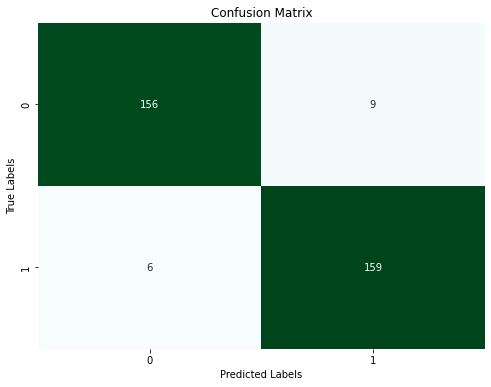

In [144]:
plt.figure(figsize=(8, 6))
sns.heatmap(matrix, annot=True, fmt="d", cmap="BuGn", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

In [145]:
import pickle


model_dict = {
    'model': lg,
    'accuracy_score': score,
    'classification_report': report,
    'confusion_matrix': matrix
}
with open('logistic_regression_model_evaluation.pkl', 'wb') as file:
    pickle.dump(model_dict, file)

# Now We have checked the Score and confusion matrix and pickled are model for web app deployment
- We will use either Flask or Streamlit
- We can also check ROc-AUC curve but it is fine now as we have checked all details quiet deeply.